In [532]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torch.optim import Adam

import os
import time
import math
import numpy as np
import skimage.io as io
from torchsummary import summary

from di_dataset2 import DepthImageDataset, collate_batch

In [402]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

# Hyperparams

In [510]:
latent_dim = 100
num_epochs = 10
batch_size = 32
learning_rate = 1e-3

save_model = True
load_model = False

save_model_file = "../../../vae_models/vae_resnet_full.pth"
load_model_file = "../../../vae_models/vae_resnet.pth"

# Load Dataset

In [4]:
tfrecord_folder='../../../rl_data/tfrecord'
tfrecord_test_folder='../../../rl_data/tfrecord/test'

In [534]:
train_dataset = DepthImageDataset(tfrecord_folder=tfrecord_folder, batch_size=batch_size) # 176 tfrecords
test_dataset = DepthImageDataset(tfrecord_folder=tfrecord_test_folder, batch_size=batch_size) # 20 tfrecords

Loading tfrecords...
Done.
Loading tfrecords...
Done.


In [6]:
# len_train_dataset = sum(1 for _ in train_dataset) # 11223 batches (of 32)
# len_test_dataset = sum(1 for _ in test_dataset) # 1305 batches (of 32)
len_train_dataset, len_test_dataset = (69, 66) #(11223, 1305), 1 tfrecord will have varying lengths

In [7]:
train_loader = DataLoader(dataset=train_dataset, batch_size=1, collate_fn=collate_batch)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, collate_fn=collate_batch)

In [8]:
dataiter = iter(train_loader)
image_batch, *_ = dataiter.next() # image, height, width, depth
image_batch.shape

2022-03-01 12:16:32.805997: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-03-01 12:16:32.829087: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3199980000 Hz


torch.Size([32, 1, 270, 480])

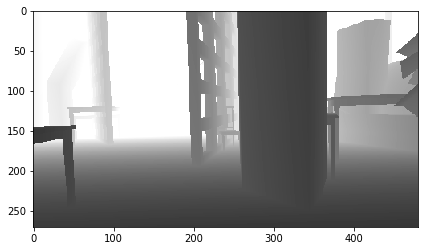

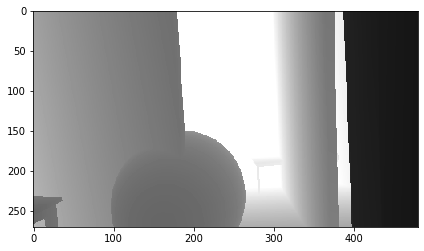

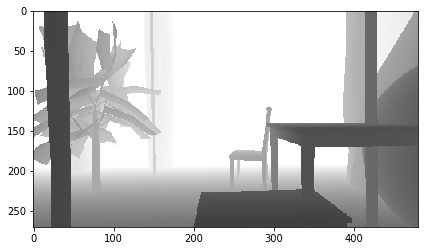

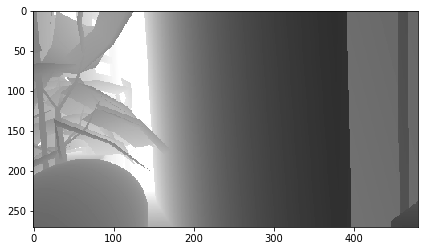

torch.Size([1, 270, 480])

In [9]:
def imshow(image):
    io.imshow(image.squeeze().numpy())
    io.show()

for image in image_batch[0:4]:
    imshow(image)
    
image.shape

In [10]:
image_batch.squeeze().mean(), image_batch.squeeze().var()

(tensor(0.5104), tensor(0.1116))

# Define Variational Autoencoder

Adapted from https://github.com/microsoft/AirSim-Drone-Racing-VAE-Imitation/blob/master/racing_models/cmvae.py

### Dronet
ResNet8 as encoder.

In [11]:
image_batch, *_ = dataiter.next()

In [535]:
class Dronet(nn.Module):
    def __init__(self, input_dim, num_outputs, include_top=True):
        super(Dronet, self).__init__()
        self.include_top = include_top
        
        print('[Dronet] Starting dronet')

        self.max0 = nn.MaxPool2d(kernel_size=2, stride=2)  # default pool_size='2', strides=2

        self.bn0 = nn.BatchNorm2d(32)
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(32)
        self.bn3 = nn.BatchNorm2d(64)
        self.bn4 = nn.BatchNorm2d(64)
        self.bn5 = nn.BatchNorm2d(128)

        self.conv0 = nn.Conv2d(input_dim, 32, kernel_size=5, stride=2, padding=2)
        self.xavier_uniform_init(self.conv0)

        self.conv1 = nn.Conv2d(32, 32, kernel_size=3, stride=2, padding=1) # padding='same' 
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1) # padding='same' # Todo: kernel_regularizer=tf.keras.regularizers.l2(1e-4)
        self.conv3 = nn.Conv2d(32, 32, kernel_size=1, stride=2)
        self.xavier_uniform_init(self.conv3)

        self.conv4 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1) # padding='same' # Todo: kernel_regularizer=tf.keras.regularizers.l2(1e-4)
        self.conv5 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1) # padding='same' # Todo: kernel_regularizer=tf.keras.regularizers.l2(1e-4)
        self.conv6 = nn.Conv2d(32, 64, kernel_size=1, stride=2) # padding='same'
        self.xavier_uniform_init(self.conv6)

        self.conv7 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1) # padding='same' # Todo: kernel_regularizer=tf.keras.regularizers.l2(1e-4)
        self.conv8 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1) # padding='same' # Todo: kernel_regularizer=tf.keras.regularizers.l2(1e-4)
        self.conv9 = nn.Conv2d(64, 128, kernel_size=1, stride=2) # padding='same'
        self.xavier_uniform_init(self.conv9)

        self.dense0 = nn.Linear(9*15*128, 64) # Todo: check size
        self.dense1 = nn.Linear(64, 32)
        self.dense2 = nn.Linear(32, num_outputs)
        self.dense3 = nn.Linear(9*15*128, num_outputs)

        print('[Dronet] Done with dronet')
    
    
    def xavier_uniform_init(self, m):
        """
        Default initialisation in Keras is glorot_uniform == xavier_uniform in Pytorch

        https://discuss.pytorch.org/t/crossentropyloss-expected-object-of-type-torch-longtensor/28683/6?u=ptrblck
        https://stackoverflow.com/questions/49433936/how-to-initialize-weights-in-pytorch
        """
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
            nn.init.xavier_uniform_(m.weight, gain=nn.init.calculate_gain('linear')) # gain=nn.init.calculate_gain('relu')
            nn.init.zeros_(m.bias)
        return m

    def forward(self, img):
        # Input
        
        #print(img.shape)
        print(f"- Before encoding, mean: {img.mean():.3f} var: {img.var():.3f}")
        x1 = self.conv0(img)
        #print("x1:", x1.shape)
        x1 = self.max0(x1)
        #print("x1:", x1.shape)

        # First residual block
        x2 = self.bn0(x1)
        #print("x2:", x2.shape)
        # x2 = x1
        x2 = torch.relu(x2)
        #print(x2.shape)
        x2 = self.conv1(x2)
        #print(x2.shape)

        x2 = self.bn1(x2)
        #print(x2.shape)
        x2 = torch.relu(x2)
        #print(x2.shape)
        x2 = self.conv2(x2)
        #print(x2.shape)
        
        
        x1 = self.conv3(x1)
        #print(f"x1: {x1.shape}, x2: {x2.shape}") # 32, 34, 60
        x3 = x1+x2
        #print("x3:", x3.shape)

        # Second residual block
        x4 = self.bn2(x3)
        #print("x4:", x4.shape)
        # x4 = x3
        x4 = torch.relu(x4)
        x4 = self.conv4(x4)
        #print(x4.shape)

        x4 = self.bn3(x4)
        #print(x4.shape)
        x4 = torch.relu(x4)
        x4 = self.conv5(x4)
        #print(x4.shape)
        
        x3 = self.conv6(x3)
        #print(f"x3: {x3.shape}, x4: {x4.shape}")
        x5 = x3+x4 # 34, 60, 64

        # Third residual block
        x6 = self.bn4(x5)
        # x6 = x5
        x6 = torch.relu(x6)
        x6 = self.conv7(x6)

        x6 = self.bn5(x6)
        x6 = torch.relu(x6)
        x6 = self.conv8(x6)

        x5 = self.conv9(x5)
        #print(f"x5: {x5.shape}, x6: {x6.shape}")
        x7 = x5+x6 # 17, 30, 128

        x = x7.view(x7.size(0), -1)
        #print(f"x before linear: {x.shape}")
        print(f"- After encoding, mean: {x.mean():.3f} var: {x.var():.3f}")

        if self.include_top:
            x = torch.relu(x)
            # x = tf.keras.layers.Dropout(0.5)(x)
            x = self.dense0(x)
            x = self.dense1(x)
            #gate_pose = self.dense2(x)
            x_enc = self.dense2(x)
            # phi_rel = self.dense_phi_rel(x)
            # gate_pose = tf.concat([gate_pose, phi_rel], 1)
            #print(f"x_enc: {x.shape}")
            return x_enc
        else:
            x = self.dense3(x)
            #print(f"x_enc: {x.shape}")
            return x

dronet = Dronet(input_dim=1, num_outputs=latent_dim*2, include_top=False)

[Dronet] Starting dronet
[Dronet] Done with dronet


In [536]:
summary(dronet, input_size=(1, 270, 480), batch_size=-1, device=device.type)

- Before encoding, mean: 0.499 var: 0.083
- After encoding, mean: 0.084 var: 0.322
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 135, 240]             832
         MaxPool2d-2          [-1, 32, 67, 120]               0
       BatchNorm2d-3          [-1, 32, 67, 120]              64
            Conv2d-4           [-1, 32, 34, 60]           9,248
       BatchNorm2d-5           [-1, 32, 34, 60]              64
            Conv2d-6           [-1, 32, 34, 60]           9,248
            Conv2d-7           [-1, 32, 34, 60]           1,056
       BatchNorm2d-8           [-1, 32, 34, 60]              64
            Conv2d-9           [-1, 64, 17, 30]          18,496
      BatchNorm2d-10           [-1, 64, 17, 30]             128
           Conv2d-11           [-1, 64, 17, 30]          36,928
           Conv2d-12           [-1, 64, 17, 30]           2,112
      BatchNorm2d-13

### Decoder

In [537]:
class ImgDecoder(nn.Module):
    def __init__(self, input_dim=100, batch=32):
        super(ImgDecoder, self).__init__()
        print('[ImgDecoder] Starting create_model')
        self.dense = nn.Linear(input_dim, 9*15*128)
        
        self.bn0 = nn.BatchNorm2d(128)
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(32)
        self.bn3 = nn.BatchNorm2d(64)
        self.bn4 = nn.BatchNorm2d(64)
        self.bn5 = nn.BatchNorm2d(128)

        self.deconv1 = nn.ConvTranspose2d(128, 128, kernel_size=3, stride=1, padding=1)
        self.deconv2 = nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2, padding=(2,2), output_padding=(0,1), dilation=1)
        self.deconv3 = nn.ConvTranspose2d(64, 64, kernel_size=6, stride=2, padding=(2,2), output_padding=(0,0), dilation=1)
        self.deconv4 = nn.ConvTranspose2d(64, 32, kernel_size=5, stride=2, padding=(2,2), output_padding=(0,1), dilation=1)
        self.deconv5 = nn.ConvTranspose2d(32, 16, kernel_size=6, stride=2, padding=(2,2), output_padding=(1,0), dilation=1)
        self.deconv6 = nn.ConvTranspose2d(16, 8, kernel_size=6, stride=2, padding=(2,2), output_padding=(0,0))
        self.deconv7 = nn.ConvTranspose2d(8, 1, kernel_size=5, stride=1, padding=2) # tanh activation or sigmoid

        print('[ImgDecoder] Done with create_model')

    def forward(self, z):
        #print("z: ", z.shape)
        x = self.dense(z)
        #print(x.shape)
        x = x.view(x.size(0), 128, 9, 15)
        print(f"- Before deconv, mean: {x.mean():.3f} var: {x.var():.3f}")
        x = self.deconv1(x)
        x = torch.relu(x)
        #print("after deconv1", x.shape)
        x = self.deconv2(x)
        x = torch.relu(x)
        #print("after deconv2", x.shape)
        x = self.deconv3(x)
        x = torch.relu(x)
        #print("after deconv3", x.shape)
        x = self.deconv4(x)
        x = torch.relu(x)
        #print("after deconv4", x.shape)
        x = self.deconv5(x)
        x = torch.relu(x)
        #print("after deconv5", x.shape)
        x = self.deconv6(x)
        x = torch.relu(x)
        #print("after deconv6", x.shape)
        x = self.deconv7(x)
        print(f"- After deconv 7, mean: {x.mean():.3f} var: {x.var():.3f}")
        x = torch.sigmoid(x)
        print(f"- After sigmoid, mean: {x.mean():.3f} var: {x.var():.3f}")
        #print("after deconv7", x.shape)
        return x

# img_decoder = ImgDecoder(input_dim=latent_dim, batch=1)
# summary(img_decoder, (1,latent_dim))

## VAE

In [538]:
class Lambda(nn.Module):
    def __init__(self, func):
        super(Lambda, self).__init__()
        self.func = func
        
    def forward(self, x):
        return self.func(x)
        

class VAE(nn.Module):
    def __init__(self, n_z):
        super(VAE, self).__init__()
        
        # create the 3 base models:
        self.q_img = Dronet(input_dim=1, num_outputs=latent_dim*2, include_top=True)
        self.p_img = ImgDecoder(input_dim=n_z)
        
        # Create sampler
        self.mean_params = Lambda(lambda x: x[:, :n_z])
        self.logvar_params = Lambda(lambda x: x[:, n_z:])

    def forward(self, x):
        # Possible modes for reconstruction:
        # img -> img

        x = self.q_img(x)
        
        means = self.mean_params(x)
        logvar = self.logvar_params(x)
        stddev = torch.exp(0.5 * logvar)
        eps = torch.randn_like(stddev)
        z = means + eps * stddev
        #print(z.shape)
        #print("OK")
        img_recon = self.p_img(z)
        return img_recon, means, logvar, z

    def encode(self, x):
        x = self.q_img(x)
        means = self.mean_params(x)
        stddev = torch.exp(0.5 * self.stddev_params(x))
        eps = torch.randn_like(stddev)
        z = means + eps * stddev
        return z, means, stddev

    def decode(self, z, mode):
        # Possible modes for reconstruction:
        # z -> img
        img_recon = self.p_img(z)
        return img_recon

### Define Model

In [539]:
vae_model = VAE(n_z=latent_dim)

if load_model:
    vae_model.load_state_dict(torch.load(load_model_file))
    vae_model.eval()
else:
    vae_model.train()

optimiser = torch.optim.Adam(vae_model.parameters(), lr=learning_rate)
summary(vae_model, (1, 270, 480))

[Dronet] Starting dronet
[Dronet] Done with dronet
[ImgDecoder] Starting create_model
[ImgDecoder] Done with create_model
- Before encoding, mean: 0.500 var: 0.083
- After encoding, mean: 0.006 var: 0.366
- Before deconv, mean: -0.004 var: 0.372
- After deconv 7, mean: 0.132 var: 0.000
- After sigmoid, mean: 0.533 var: 0.000
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 135, 240]             832
         MaxPool2d-2          [-1, 32, 67, 120]               0
       BatchNorm2d-3          [-1, 32, 67, 120]              64
            Conv2d-4           [-1, 32, 34, 60]           9,248
       BatchNorm2d-5           [-1, 32, 34, 60]              64
            Conv2d-6           [-1, 32, 34, 60]           9,248
            Conv2d-7           [-1, 32, 34, 60]           1,056
       BatchNorm2d-8           [-1, 32, 34, 60]              64
            Conv2d-9           [

# Training

In [540]:
def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.BCELoss(reduction='sum')(x_hat, x)
    KLD      = 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss - KLD

In [541]:
n_training_samples = len_train_dataset * 32 # 32 samples per batch
n_iterations = len_train_dataset
n_training_samples, n_iterations

(2208, 69)

Loading tfrecords...
Done.
- Before encoding, mean: 0.471 var: 0.111
- After encoding, mean: 0.003 var: 0.340
- Before deconv, mean: -0.000 var: 0.341
- After deconv 7, mean: 0.132 var: 0.000
- After sigmoid, mean: 0.533 var: 0.000
Epoch: 1/10, Step: 1/69, Avg loss: 90605.008, time: 3.05, Avg. per iter 2.72, Est. time left 185.26

- Before encoding, mean: 0.501 var: 0.135
- After encoding, mean: -0.129 var: 0.459
- Before deconv, mean: -0.013 var: 2.583
- After deconv 7, mean: 0.121 var: 0.000
- After sigmoid, mean: 0.530 var: 0.000
Epoch: 1/10, Step: 2/69, Avg loss: 90486.219, time: 6.12, Avg. per iter 2.90, Est. time left 193.97

- Before encoding, mean: 0.558 var: 0.120
- After encoding, mean: -0.475 var: 0.395
- Before deconv, mean: -0.000 var: 0.331
- After deconv 7, mean: 0.111 var: 0.000
- After sigmoid, mean: 0.528 var: 0.000
Epoch: 1/10, Step: 3/69, Avg loss: 90057.781, time: 9.15, Avg. per iter 2.94, Est. time left 194.03

- Before encoding, mean: 0.516 var: 0.112
- After enc

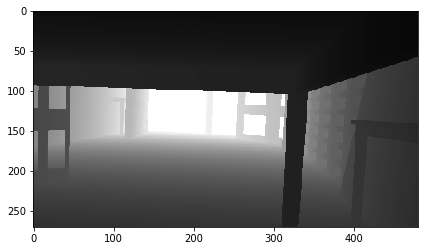

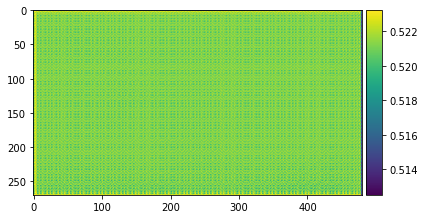

- Before encoding, mean: 0.527 var: 0.125
- After encoding, mean: -1.706 var: 0.936
- Before deconv, mean: -0.001 var: 0.336
- After deconv 7, mean: 0.082 var: 0.000
- After sigmoid, mean: 0.521 var: 0.000
Epoch: 1/10, Step: 11/69, Avg loss: 89917.680, time: 30.56, Avg. per iter 2.72, Est. time left 158.03

- Before encoding, mean: 0.586 var: 0.123
- After encoding, mean: -1.784 var: 1.008
- Before deconv, mean: 0.000 var: 0.322
- After deconv 7, mean: 0.080 var: 0.000
- After sigmoid, mean: 0.520 var: 0.000
Epoch: 1/10, Step: 12/69, Avg loss: 89844.898, time: 33.13, Avg. per iter 2.71, Est. time left 154.61

- Before encoding, mean: 0.535 var: 0.117
- After encoding, mean: -1.830 var: 1.180
- Before deconv, mean: 0.000 var: 0.353
- After deconv 7, mean: 0.081 var: 0.000
- After sigmoid, mean: 0.520 var: 0.000
Epoch: 1/10, Step: 13/69, Avg loss: 89823.867, time: 35.72, Avg. per iter 2.70, Est. time left 151.32

- Before encoding, mean: 0.514 var: 0.110
- After encoding, mean: -1.934 va

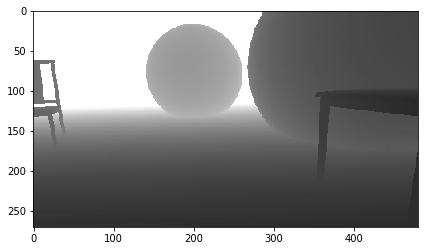

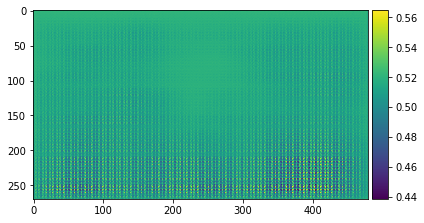

- Before encoding, mean: 0.460 var: 0.104
- After encoding, mean: -2.371 var: 2.086
- Before deconv, mean: -0.012 var: 7.461
- After deconv 7, mean: -0.083 var: 0.131
- After sigmoid, mean: 0.482 var: 0.006
Epoch: 1/10, Step: 21/69, Avg loss: 89750.430, time: 57.69, Avg. per iter 2.71, Est. time left 129.95

- Before encoding, mean: 0.463 var: 0.117
- After encoding, mean: -2.379 var: 2.137
- Before deconv, mean: -0.011 var: 1.207
- After deconv 7, mean: -0.143 var: 0.129
- After sigmoid, mean: 0.467 var: 0.007
Epoch: 1/10, Step: 22/69, Avg loss: 89569.656, time: 60.69, Avg. per iter 2.72, Est. time left 127.85

- Before encoding, mean: 0.470 var: 0.126
- After encoding, mean: -2.441 var: 2.431
- Before deconv, mean: -0.013 var: 1.137
- After deconv 7, mean: -0.465 var: 0.629
- After sigmoid, mean: 0.407 var: 0.021
Epoch: 1/10, Step: 23/69, Avg loss: 89175.766, time: 63.65, Avg. per iter 2.73, Est. time left 125.62

- Before encoding, mean: 0.439 var: 0.114
- After encoding, mean: -2.4

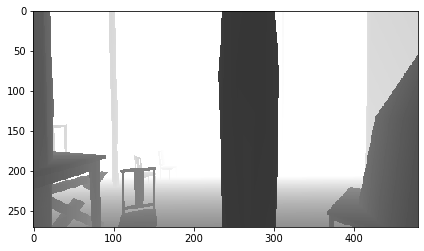

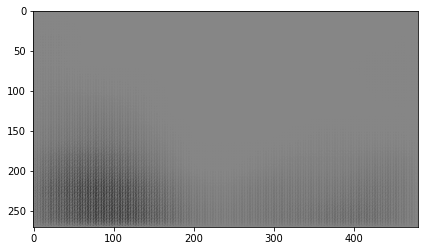

- Before encoding, mean: 0.526 var: 0.116
- After encoding, mean: -2.700 var: 2.298
- Before deconv, mean: -0.002 var: 0.438
- After deconv 7, mean: -0.318 var: 0.385
- After sigmoid, mean: 0.433 var: 0.015
Epoch: 1/10, Step: 31/69, Avg loss: 87888.516, time: 85.99, Avg. per iter 2.74, Est. time left 104.14

- Before encoding, mean: 0.518 var: 0.115
- After encoding, mean: -2.704 var: 2.350
- Before deconv, mean: 0.003 var: 0.469
- After deconv 7, mean: -0.107 var: 0.118
- After sigmoid, mean: 0.476 var: 0.006
Epoch: 1/10, Step: 32/69, Avg loss: 87773.680, time: 88.61, Avg. per iter 2.74, Est. time left 101.25

- Before encoding, mean: 0.509 var: 0.125
- After encoding, mean: -2.702 var: 2.425
- Before deconv, mean: 0.004 var: 0.493
- After deconv 7, mean: -0.119 var: 0.132
- After sigmoid, mean: 0.473 var: 0.007
Epoch: 1/10, Step: 33/69, Avg loss: 87648.531, time: 91.13, Avg. per iter 2.73, Est. time left 98.27

- Before encoding, mean: 0.512 var: 0.118
- After encoding, mean: -2.785 

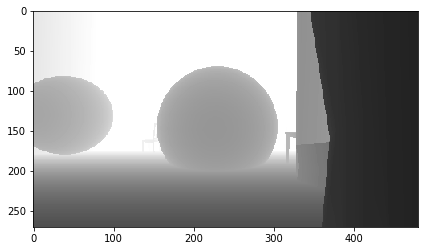

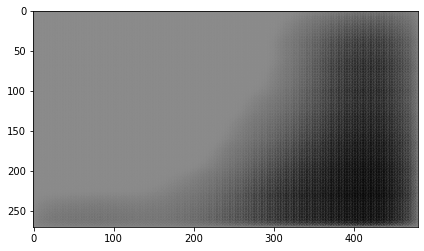

- Before encoding, mean: 0.438 var: 0.106
- After encoding, mean: -2.999 var: 4.502
- Before deconv, mean: -0.007 var: 0.865
- After deconv 7, mean: -0.561 var: 1.045
- After sigmoid, mean: 0.399 var: 0.028
Epoch: 1/10, Step: 41/69, Avg loss: 86254.203, time: 111.65, Avg. per iter 2.69, Est. time left 75.40

- Before encoding, mean: 0.479 var: 0.108
- After encoding, mean: -3.063 var: 4.477
- Before deconv, mean: -0.009 var: 0.982
- After deconv 7, mean: -0.832 var: 1.772
- After sigmoid, mean: 0.366 var: 0.038
Epoch: 1/10, Step: 42/69, Avg loss: 86083.734, time: 114.27, Avg. per iter 2.69, Est. time left 72.66

- Before encoding, mean: 0.450 var: 0.102
- After encoding, mean: -3.037 var: 4.778
- Before deconv, mean: -0.006 var: 0.911
- After deconv 7, mean: -0.531 var: 0.655
- After sigmoid, mean: 0.392 var: 0.023
Epoch: 1/10, Step: 43/69, Avg loss: 85904.648, time: 116.97, Avg. per iter 2.69, Est. time left 69.97

- Before encoding, mean: 0.516 var: 0.117
- After encoding, mean: -3.1

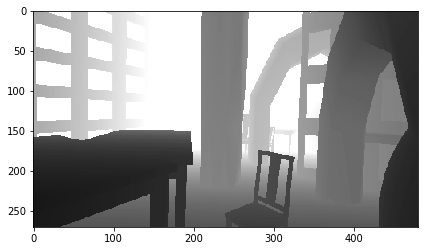

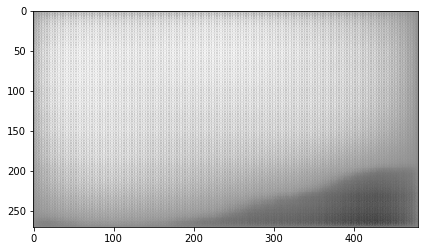

- Before encoding, mean: 0.473 var: 0.110
- After encoding, mean: -3.157 var: 4.096
- Before deconv, mean: 0.007 var: 1.890
- After deconv 7, mean: 0.447 var: 1.228
- After sigmoid, mean: 0.579 var: 0.044
Epoch: 1/10, Step: 51/69, Avg loss: 84281.820, time: 138.82, Avg. per iter 2.69, Est. time left 48.48

- Before encoding, mean: 0.448 var: 0.100
- After encoding, mean: -3.204 var: 4.207
- Before deconv, mean: -0.007 var: 1.584
- After deconv 7, mean: 0.106 var: 0.892
- After sigmoid, mean: 0.518 var: 0.040
Epoch: 1/10, Step: 52/69, Avg loss: 84089.836, time: 141.50, Avg. per iter 2.69, Est. time left 45.78

- Before encoding, mean: 0.444 var: 0.084
- After encoding, mean: -3.243 var: 4.418
- Before deconv, mean: -0.014 var: 1.630
- After deconv 7, mean: -0.252 var: 0.895
- After sigmoid, mean: 0.446 var: 0.040
Epoch: 1/10, Step: 53/69, Avg loss: 83925.680, time: 144.03, Avg. per iter 2.69, Est. time left 43.04

- Before encoding, mean: 0.534 var: 0.119
- After encoding, mean: -3.282 

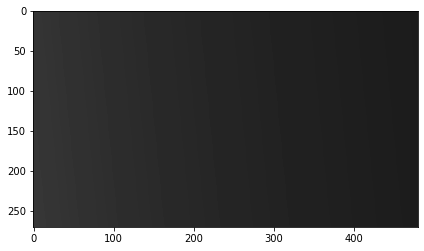

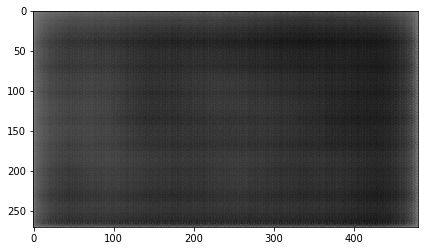

- Before encoding, mean: 0.567 var: 0.109
- After encoding, mean: -3.368 var: 4.124
- Before deconv, mean: -0.035 var: 2.691
- After deconv 7, mean: -0.334 var: 2.436
- After sigmoid, mean: 0.437 var: 0.072
Epoch: 1/10, Step: 61/69, Avg loss: 82543.273, time: 165.70, Avg. per iter 2.69, Est. time left 21.51

- Before encoding, mean: 0.456 var: 0.109
- After encoding, mean: -3.393 var: 4.283
- Before deconv, mean: -0.028 var: 2.432
- After deconv 7, mean: -0.267 var: 2.163
- After sigmoid, mean: 0.440 var: 0.065
Epoch: 1/10, Step: 62/69, Avg loss: 82338.938, time: 168.32, Avg. per iter 2.69, Est. time left 18.82

- Before encoding, mean: 0.419 var: 0.113
- After encoding, mean: -3.407 var: 4.608
- Before deconv, mean: -0.031 var: 2.252
- After deconv 7, mean: -0.051 var: 1.670
- After sigmoid, mean: 0.478 var: 0.059
Epoch: 1/10, Step: 63/69, Avg loss: 82136.578, time: 170.86, Avg. per iter 2.69, Est. time left 16.11

- Before encoding, mean: 0.478 var: 0.109
- After encoding, mean: -3.4

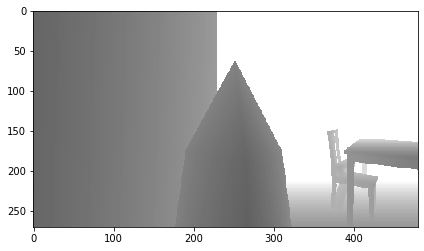

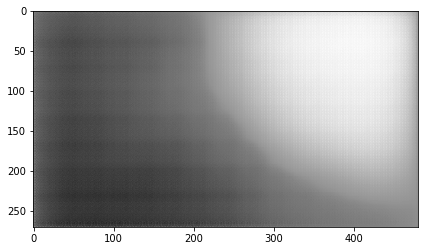

- Before encoding, mean: 0.480 var: 0.107
- After encoding, mean: -3.500 var: 5.338
- Before deconv, mean: -0.024 var: 2.098
- After deconv 7, mean: -0.024 var: 1.741
- After sigmoid, mean: 0.479 var: 0.057
Epoch: 2/10, Step: 11/69, Avg loss: 68208.547, time: 28.35, Avg. per iter 2.65, Est. time left 153.63

- Before encoding, mean: 0.426 var: 0.119
- After encoding, mean: -3.494 var: 6.192
- Before deconv, mean: -0.014 var: 2.856
- After deconv 7, mean: 0.132 var: 2.531
- After sigmoid, mean: 0.485 var: 0.062
Epoch: 2/10, Step: 12/69, Avg loss: 67857.359, time: 30.87, Avg. per iter 2.65, Est. time left 150.88

- Before encoding, mean: 0.457 var: 0.113
- After encoding, mean: -3.500 var: 5.626
- Before deconv, mean: -0.023 var: 2.584
- After deconv 7, mean: -0.043 var: 2.667
- After sigmoid, mean: 0.466 var: 0.072
Epoch: 2/10, Step: 13/69, Avg loss: 67670.820, time: 33.49, Avg. per iter 2.65, Est. time left 148.22

- Before encoding, mean: 0.433 var: 0.099
- After encoding, mean: -3.45

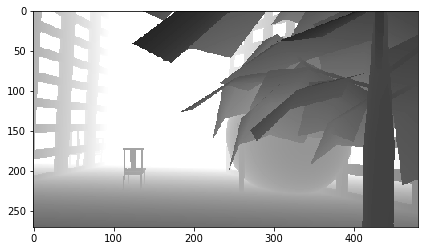

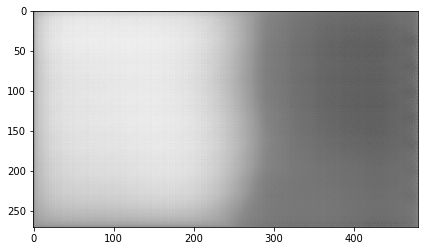

- Before encoding, mean: 0.471 var: 0.104
- After encoding, mean: -3.633 var: 6.166
- Before deconv, mean: -0.025 var: 2.884
- After deconv 7, mean: 0.566 var: 4.311
- After sigmoid, mean: 0.532 var: 0.070
Epoch: 2/10, Step: 21/69, Avg loss: 68181.859, time: 54.23, Avg. per iter 2.64, Est. time left 126.69

- Before encoding, mean: 0.535 var: 0.120
- After encoding, mean: -3.659 var: 5.607
- Before deconv, mean: -0.030 var: 3.024
- After deconv 7, mean: 0.281 var: 4.157
- After sigmoid, mean: 0.499 var: 0.085
Epoch: 2/10, Step: 22/69, Avg loss: 68057.828, time: 56.75, Avg. per iter 2.64, Est. time left 123.99

- Before encoding, mean: 0.439 var: 0.093
- After encoding, mean: -3.595 var: 5.919
- Before deconv, mean: -0.035 var: 2.957
- After deconv 7, mean: 0.004 var: 3.971
- After sigmoid, mean: 0.461 var: 0.088
Epoch: 2/10, Step: 23/69, Avg loss: 68344.148, time: 59.27, Avg. per iter 2.64, Est. time left 121.29

- Before encoding, mean: 0.376 var: 0.083
- After encoding, mean: -3.571 

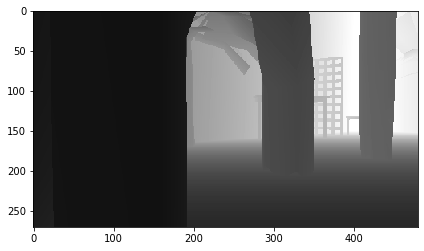

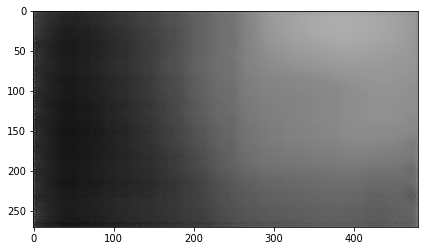

- Before encoding, mean: 0.471 var: 0.113
- After encoding, mean: -3.691 var: 5.632
- Before deconv, mean: -0.022 var: 2.499
- After deconv 7, mean: 0.016 var: 1.779
- After sigmoid, mean: 0.493 var: 0.059
Epoch: 2/10, Step: 31/69, Avg loss: 68424.320, time: 81.10, Avg. per iter 2.64, Est. time left 100.41

- Before encoding, mean: 0.443 var: 0.120
- After encoding, mean: -3.623 var: 6.617
- Before deconv, mean: -0.020 var: 3.195
- After deconv 7, mean: 0.067 var: 3.425
- After sigmoid, mean: 0.486 var: 0.085
Epoch: 2/10, Step: 32/69, Avg loss: 68287.328, time: 83.80, Avg. per iter 2.64, Est. time left 97.78

- Before encoding, mean: 0.447 var: 0.115
- After encoding, mean: -3.694 var: 5.953
- Before deconv, mean: -0.021 var: 3.935
- After deconv 7, mean: -0.056 var: 6.152
- After sigmoid, mean: 0.457 var: 0.104
Epoch: 2/10, Step: 33/69, Avg loss: 68218.633, time: 86.47, Avg. per iter 2.64, Est. time left 95.15

- Before encoding, mean: 0.530 var: 0.114
- After encoding, mean: -3.641 v

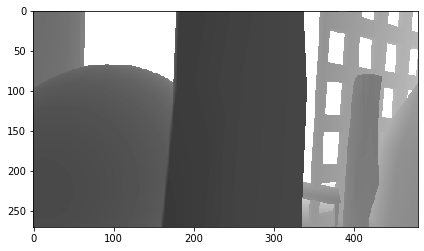

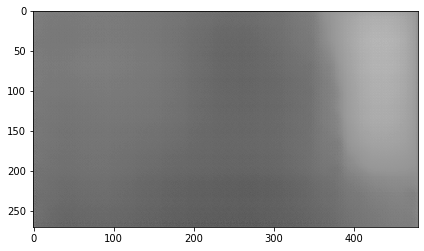

- Before encoding, mean: 0.457 var: 0.116
- After encoding, mean: -3.747 var: 6.403
- Before deconv, mean: -0.035 var: 3.442
- After deconv 7, mean: -0.268 var: 2.389
- After sigmoid, mean: 0.433 var: 0.070
Epoch: 2/10, Step: 41/69, Avg loss: 68401.656, time: 108.36, Avg. per iter 2.65, Est. time left 74.15

- Before encoding, mean: 0.413 var: 0.104
- After encoding, mean: -3.726 var: 6.376
- Before deconv, mean: -0.041 var: 3.717
- After deconv 7, mean: -0.493 var: 3.170
- After sigmoid, mean: 0.414 var: 0.089
Epoch: 2/10, Step: 42/69, Avg loss: 68357.086, time: 111.19, Avg. per iter 2.65, Est. time left 71.55

- Before encoding, mean: 0.486 var: 0.109
- After encoding, mean: -3.769 var: 6.857
- Before deconv, mean: -0.041 var: 4.037
- After deconv 7, mean: -0.497 var: 4.084
- After sigmoid, mean: 0.402 var: 0.096
Epoch: 2/10, Step: 43/69, Avg loss: 68418.742, time: 114.02, Avg. per iter 2.65, Est. time left 68.94

- Before encoding, mean: 0.469 var: 0.108
- After encoding, mean: -3.7

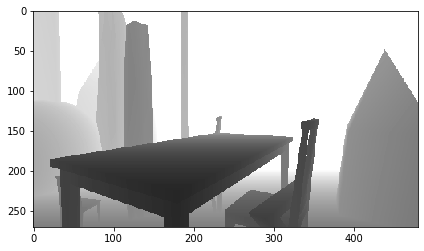

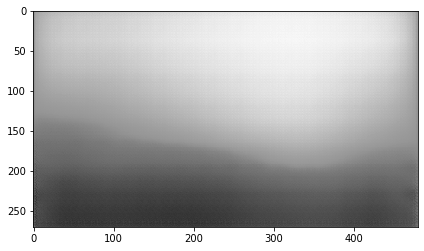

- Before encoding, mean: 0.434 var: 0.100
- After encoding, mean: -3.775 var: 6.373
- Before deconv, mean: -0.032 var: 3.364
- After deconv 7, mean: -0.487 var: 2.765
- After sigmoid, mean: 0.411 var: 0.078
Epoch: 2/10, Step: 51/69, Avg loss: 68398.938, time: 135.23, Avg. per iter 2.65, Est. time left 47.69

- Before encoding, mean: 0.482 var: 0.103
- After encoding, mean: -3.818 var: 6.545
- Before deconv, mean: -0.031 var: 3.157
- After deconv 7, mean: -0.338 var: 2.467
- After sigmoid, mean: 0.427 var: 0.077
Epoch: 2/10, Step: 52/69, Avg loss: 68392.555, time: 137.76, Avg. per iter 2.65, Est. time left 45.03

- Before encoding, mean: 0.430 var: 0.089
- After encoding, mean: -3.722 var: 6.672
- Before deconv, mean: -0.023 var: 3.028
- After deconv 7, mean: -0.103 var: 2.036
- After sigmoid, mean: 0.457 var: 0.061
Epoch: 2/10, Step: 53/69, Avg loss: 68454.641, time: 140.34, Avg. per iter 2.65, Est. time left 42.37

- Before encoding, mean: 0.467 var: 0.107
- After encoding, mean: -3.7

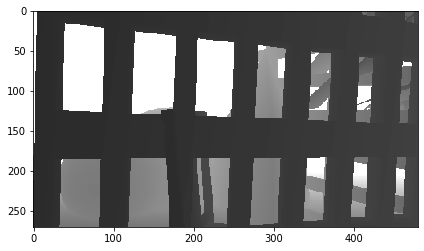

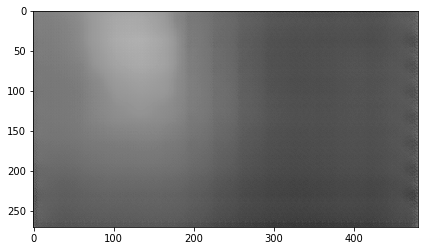

- Before encoding, mean: 0.476 var: 0.104
- After encoding, mean: -3.819 var: 6.694
- Before deconv, mean: -0.026 var: 3.224
- After deconv 7, mean: 0.256 var: 4.263
- After sigmoid, mean: 0.494 var: 0.087
Epoch: 2/10, Step: 61/69, Avg loss: 68215.156, time: 161.03, Avg. per iter 2.64, Est. time left 21.14

- Before encoding, mean: 0.501 var: 0.107
- After encoding, mean: -3.803 var: 6.712
- Before deconv, mean: -0.031 var: 3.379
- After deconv 7, mean: 0.053 var: 3.821
- After sigmoid, mean: 0.473 var: 0.084
Epoch: 2/10, Step: 62/69, Avg loss: 68163.398, time: 163.58, Avg. per iter 2.64, Est. time left 18.49

- Before encoding, mean: 0.481 var: 0.127
- After encoding, mean: -3.834 var: 7.162
- Before deconv, mean: -0.031 var: 3.193
- After deconv 7, mean: -0.039 var: 3.190
- After sigmoid, mean: 0.463 var: 0.086
Epoch: 2/10, Step: 63/69, Avg loss: 67789.602, time: 165.49, Avg. per iter 2.64, Est. time left 15.82

Loading tfrecords...
Done.
- Before encoding, mean: 0.435 var: 0.114
- A

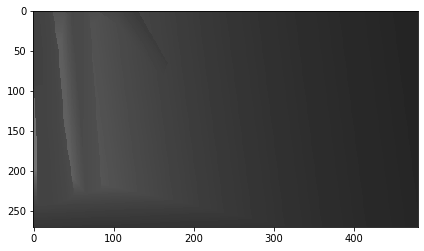

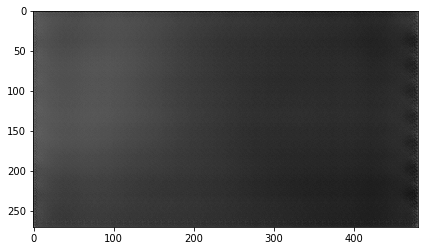

- Before encoding, mean: 0.544 var: 0.114
- After encoding, mean: -3.770 var: 6.879
- Before deconv, mean: -0.016 var: 3.438
- After deconv 7, mean: 0.098 var: 5.613
- After sigmoid, mean: 0.472 var: 0.114
Epoch: 3/10, Step: 11/69, Avg loss: 66278.008, time: 28.64, Avg. per iter 2.63, Est. time left 152.60

- Before encoding, mean: 0.431 var: 0.120
- After encoding, mean: -3.803 var: 7.193
- Before deconv, mean: -0.031 var: 2.993
- After deconv 7, mean: 0.004 var: 4.505
- After sigmoid, mean: 0.461 var: 0.103
Epoch: 3/10, Step: 12/69, Avg loss: 65802.773, time: 31.30, Avg. per iter 2.63, Est. time left 149.98

- Before encoding, mean: 0.444 var: 0.086
- After encoding, mean: -3.810 var: 6.162
- Before deconv, mean: -0.034 var: 2.971
- After deconv 7, mean: -0.051 var: 3.352
- After sigmoid, mean: 0.473 var: 0.087
Epoch: 3/10, Step: 13/69, Avg loss: 66206.953, time: 33.85, Avg. per iter 2.63, Est. time left 147.32

- Before encoding, mean: 0.431 var: 0.094
- After encoding, mean: -3.807

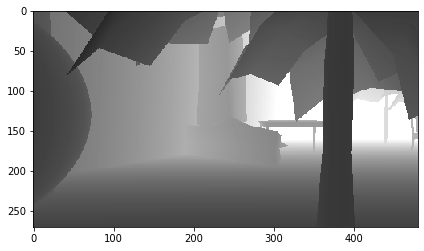

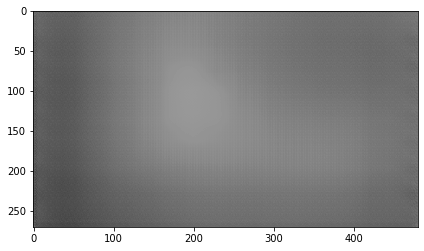

- Before encoding, mean: 0.433 var: 0.102
- After encoding, mean: -3.841 var: 6.679
- Before deconv, mean: -0.020 var: 2.372
- After deconv 7, mean: 0.103 var: 2.550
- After sigmoid, mean: 0.488 var: 0.066
Epoch: 3/10, Step: 21/69, Avg loss: 66750.078, time: 55.53, Avg. per iter 2.63, Est. time left 126.41

- Before encoding, mean: 0.486 var: 0.114
- After encoding, mean: -3.871 var: 5.908
- Before deconv, mean: -0.017 var: 2.945
- After deconv 7, mean: 0.314 var: 3.880
- After sigmoid, mean: 0.513 var: 0.083
Epoch: 3/10, Step: 22/69, Avg loss: 66613.266, time: 58.06, Avg. per iter 2.63, Est. time left 123.74

- Before encoding, mean: 0.447 var: 0.114
- After encoding, mean: -3.896 var: 6.300
- Before deconv, mean: -0.018 var: 3.374
- After deconv 7, mean: 0.351 var: 6.002
- After sigmoid, mean: 0.491 var: 0.092
Epoch: 3/10, Step: 23/69, Avg loss: 66473.406, time: 60.69, Avg. per iter 2.63, Est. time left 121.11

- Before encoding, mean: 0.471 var: 0.116
- After encoding, mean: -3.833 

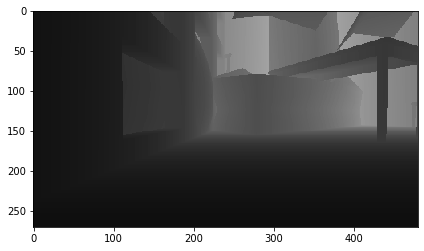

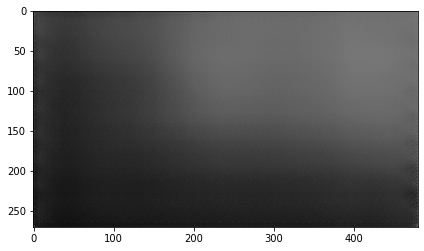

- Before encoding, mean: 0.437 var: 0.117
- After encoding, mean: -3.832 var: 6.935
- Before deconv, mean: -0.024 var: 2.569
- After deconv 7, mean: -0.269 var: 2.575
- After sigmoid, mean: 0.422 var: 0.072
Epoch: 3/10, Step: 31/69, Avg loss: 65946.305, time: 80.98, Avg. per iter 2.63, Est. time left 99.82

- Before encoding, mean: 0.506 var: 0.112
- After encoding, mean: -3.873 var: 6.894
- Before deconv, mean: -0.030 var: 2.693
- After deconv 7, mean: -0.429 var: 3.106
- After sigmoid, mean: 0.410 var: 0.088
Epoch: 3/10, Step: 32/69, Avg loss: 65977.609, time: 83.49, Avg. per iter 2.63, Est. time left 97.16

- Before encoding, mean: 0.457 var: 0.110
- After encoding, mean: -3.872 var: 6.643
- Before deconv, mean: -0.027 var: 2.790
- After deconv 7, mean: -0.348 var: 2.936
- After sigmoid, mean: 0.420 var: 0.078
Epoch: 3/10, Step: 33/69, Avg loss: 65916.523, time: 86.02, Avg. per iter 2.63, Est. time left 94.52

- Before encoding, mean: 0.425 var: 0.124
- After encoding, mean: -3.882 

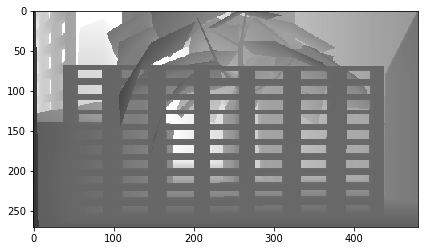

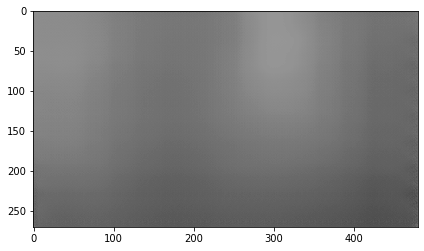

- Before encoding, mean: 0.395 var: 0.098
- After encoding, mean: -3.834 var: 6.807
- Before deconv, mean: -0.034 var: 2.730
- After deconv 7, mean: -0.060 var: 2.573
- After sigmoid, mean: 0.462 var: 0.070
Epoch: 3/10, Step: 41/69, Avg loss: 65683.062, time: 107.37, Avg. per iter 2.63, Est. time left 73.54

- Before encoding, mean: 0.525 var: 0.109
- After encoding, mean: -3.859 var: 6.524
- Before deconv, mean: -0.034 var: 2.903
- After deconv 7, mean: 0.045 var: 3.734
- After sigmoid, mean: 0.465 var: 0.085
Epoch: 3/10, Step: 42/69, Avg loss: 65666.875, time: 110.01, Avg. per iter 2.63, Est. time left 70.91

- Before encoding, mean: 0.474 var: 0.106
- After encoding, mean: -3.847 var: 6.417
- Before deconv, mean: -0.040 var: 2.634
- After deconv 7, mean: -0.155 var: 2.336
- After sigmoid, mean: 0.456 var: 0.070
Epoch: 3/10, Step: 43/69, Avg loss: 65690.422, time: 112.51, Avg. per iter 2.63, Est. time left 68.27

- Before encoding, mean: 0.472 var: 0.103
- After encoding, mean: -3.83

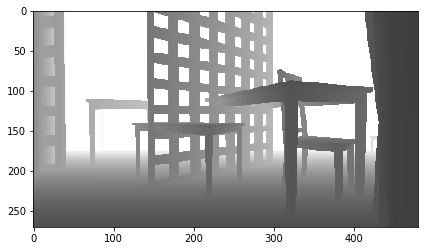

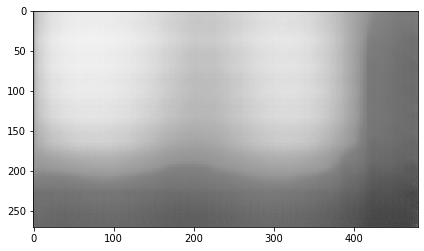

- Before encoding, mean: 0.445 var: 0.104
- After encoding, mean: -3.876 var: 6.342
- Before deconv, mean: -0.023 var: 2.625
- After deconv 7, mean: 0.157 var: 3.360
- After sigmoid, mean: 0.489 var: 0.076
Epoch: 3/10, Step: 51/69, Avg loss: 65619.031, time: 133.12, Avg. per iter 2.62, Est. time left 47.20

- Before encoding, mean: 0.467 var: 0.106
- After encoding, mean: -3.917 var: 6.088
- Before deconv, mean: -0.032 var: 2.705
- After deconv 7, mean: 0.177 var: 3.303
- After sigmoid, mean: 0.497 var: 0.078
Epoch: 3/10, Step: 52/69, Avg loss: 65593.289, time: 135.82, Avg. per iter 2.62, Est. time left 44.59

- Before encoding, mean: 0.464 var: 0.106
- After encoding, mean: -3.877 var: 6.095
- Before deconv, mean: -0.026 var: 2.603
- After deconv 7, mean: -0.039 var: 3.388
- After sigmoid, mean: 0.460 var: 0.078
Epoch: 3/10, Step: 53/69, Avg loss: 65581.234, time: 138.39, Avg. per iter 2.62, Est. time left 41.96

- Before encoding, mean: 0.464 var: 0.092
- After encoding, mean: -3.853

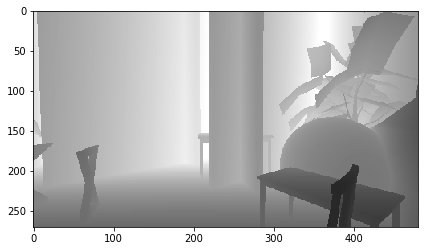

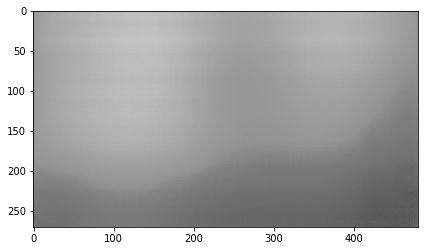

- Before encoding, mean: 0.447 var: 0.111
- After encoding, mean: -3.885 var: 6.667
- Before deconv, mean: -0.032 var: 2.729
- After deconv 7, mean: -0.274 var: 3.570
- After sigmoid, mean: 0.428 var: 0.087
Epoch: 3/10, Step: 61/69, Avg loss: 65370.773, time: 159.24, Avg. per iter 2.62, Est. time left 20.96

- Before encoding, mean: 0.520 var: 0.114
- After encoding, mean: -3.876 var: 6.537
- Before deconv, mean: -0.024 var: 2.586
- After deconv 7, mean: 0.007 var: 3.523
- After sigmoid, mean: 0.475 var: 0.088
Epoch: 3/10, Step: 62/69, Avg loss: 65335.262, time: 161.80, Avg. per iter 2.62, Est. time left 18.33

- Before encoding, mean: 0.522 var: 0.104
- After encoding, mean: -3.902 var: 5.605
- Before deconv, mean: -0.029 var: 2.486
- After deconv 7, mean: 0.283 var: 3.187
- After sigmoid, mean: 0.520 var: 0.075
Epoch: 3/10, Step: 63/69, Avg loss: 65356.430, time: 164.32, Avg. per iter 2.62, Est. time left 15.71

- Before encoding, mean: 0.494 var: 0.108
- After encoding, mean: -3.908

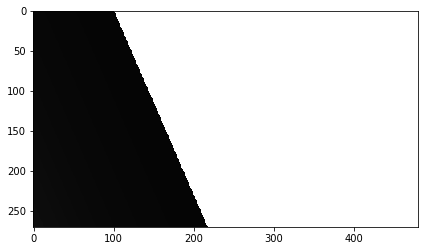

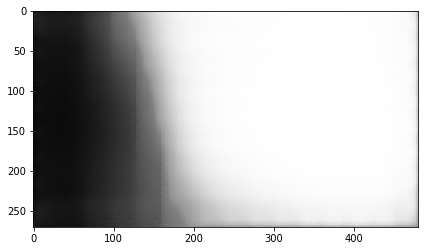

- Before encoding, mean: 0.480 var: 0.097
- After encoding, mean: -3.910 var: 6.185
- Before deconv, mean: -0.029 var: 2.466
- After deconv 7, mean: 0.166 var: 3.801
- After sigmoid, mean: 0.493 var: 0.085
Epoch: 4/10, Step: 11/69, Avg loss: 62777.227, time: 30.96, Avg. per iter 2.63, Est. time left 152.35

- Before encoding, mean: 0.475 var: 0.101
- After encoding, mean: -3.896 var: 6.381
- Before deconv, mean: -0.022 var: 2.640
- After deconv 7, mean: 0.013 var: 4.124
- After sigmoid, mean: 0.465 var: 0.086
Epoch: 4/10, Step: 12/69, Avg loss: 63043.020, time: 33.57, Avg. per iter 2.63, Est. time left 149.72

- Before encoding, mean: 0.508 var: 0.119
- After encoding, mean: -3.929 var: 6.277
- Before deconv, mean: -0.027 var: 2.528
- After deconv 7, mean: -0.065 var: 3.549
- After sigmoid, mean: 0.461 var: 0.090
Epoch: 4/10, Step: 13/69, Avg loss: 63052.523, time: 36.19, Avg. per iter 2.63, Est. time left 147.09

- Before encoding, mean: 0.465 var: 0.107
- After encoding, mean: -3.925

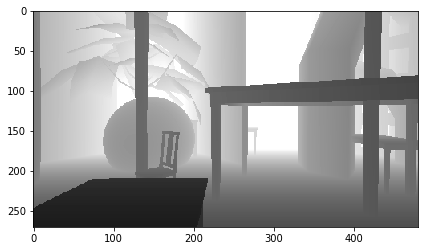

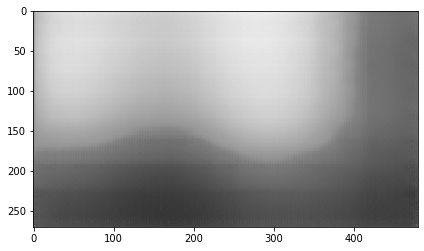

- Before encoding, mean: 0.487 var: 0.121
- After encoding, mean: -3.981 var: 5.714
- Before deconv, mean: -0.013 var: 2.471
- After deconv 7, mean: 0.299 var: 4.493
- After sigmoid, mean: 0.513 var: 0.099
Epoch: 4/10, Step: 21/69, Avg loss: 63291.227, time: 58.87, Avg. per iter 2.63, Est. time left 126.40

- Before encoding, mean: 0.538 var: 0.122
- After encoding, mean: -3.965 var: 5.955
- Before deconv, mean: -0.013 var: 2.610
- After deconv 7, mean: 0.307 var: 4.389
- After sigmoid, mean: 0.515 var: 0.101
Epoch: 4/10, Step: 22/69, Avg loss: 63051.379, time: 61.94, Avg. per iter 2.64, Est. time left 123.86

- Before encoding, mean: 0.491 var: 0.102
- After encoding, mean: -3.943 var: 5.847
- Before deconv, mean: -0.015 var: 2.471
- After deconv 7, mean: 0.191 var: 3.983
- After sigmoid, mean: 0.495 var: 0.090
Epoch: 4/10, Step: 23/69, Avg loss: 63107.457, time: 64.49, Avg. per iter 2.63, Est. time left 121.21

- Before encoding, mean: 0.544 var: 0.126
- After encoding, mean: -3.939 

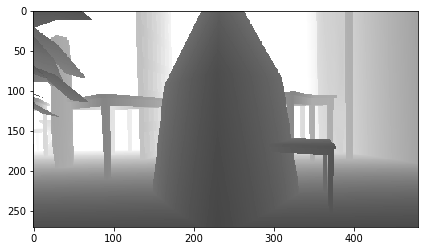

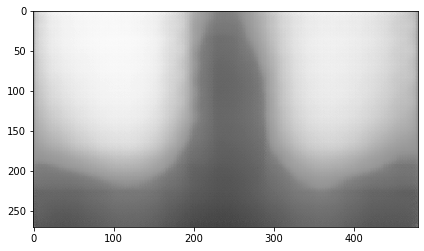

- Before encoding, mean: 0.500 var: 0.118
- After encoding, mean: -3.917 var: 6.590
- Before deconv, mean: -0.023 var: 2.375
- After deconv 7, mean: -0.108 var: 4.679
- After sigmoid, mean: 0.452 var: 0.107
Epoch: 4/10, Step: 31/69, Avg loss: 62537.934, time: 86.18, Avg. per iter 2.64, Est. time left 100.20

- Before encoding, mean: 0.472 var: 0.110
- After encoding, mean: -3.938 var: 6.317
- Before deconv, mean: -0.038 var: 2.424
- After deconv 7, mean: -0.168 var: 3.473
- After sigmoid, mean: 0.443 var: 0.090
Epoch: 4/10, Step: 32/69, Avg loss: 62525.242, time: 88.73, Avg. per iter 2.64, Est. time left 97.55

- Before encoding, mean: 0.467 var: 0.117
- After encoding, mean: -3.906 var: 6.524
- Before deconv, mean: -0.029 var: 2.126
- After deconv 7, mean: -0.046 var: 2.874
- After sigmoid, mean: 0.467 var: 0.079
Epoch: 4/10, Step: 33/69, Avg loss: 62479.008, time: 91.30, Avg. per iter 2.64, Est. time left 94.90

- Before encoding, mean: 0.525 var: 0.122
- After encoding, mean: -3.925

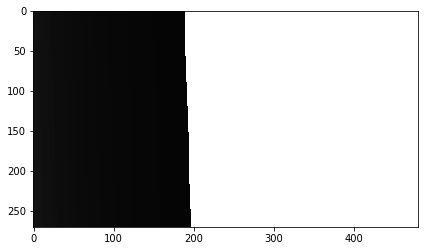

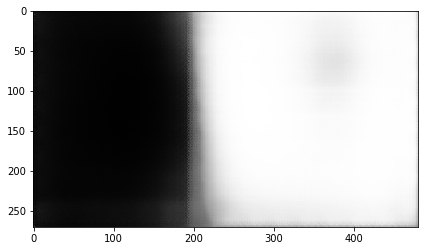

- Before encoding, mean: 0.502 var: 0.106
- After encoding, mean: -3.869 var: 6.450
- Before deconv, mean: -0.024 var: 2.146
- After deconv 7, mean: 0.250 var: 3.219
- After sigmoid, mean: 0.508 var: 0.078
Epoch: 4/10, Step: 41/69, Avg loss: 62749.242, time: 114.38, Avg. per iter 2.64, Est. time left 74.02

- Before encoding, mean: 0.533 var: 0.102
- After encoding, mean: -3.835 var: 5.800
- Before deconv, mean: -0.027 var: 1.761
- After deconv 7, mean: 0.415 var: 2.218
- After sigmoid, mean: 0.551 var: 0.059
Epoch: 4/10, Step: 42/69, Avg loss: 62880.945, time: 117.17, Avg. per iter 2.64, Est. time left 71.40

- Before encoding, mean: 0.507 var: 0.113
- After encoding, mean: -3.878 var: 6.000
- Before deconv, mean: -0.021 var: 1.675
- After deconv 7, mean: 0.509 var: 2.456
- After sigmoid, mean: 0.563 var: 0.063
Epoch: 4/10, Step: 43/69, Avg loss: 62914.391, time: 119.90, Avg. per iter 2.64, Est. time left 68.76

- Before encoding, mean: 0.490 var: 0.124
- After encoding, mean: -3.895 

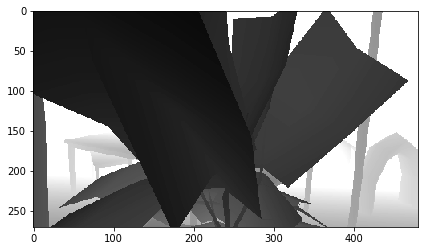

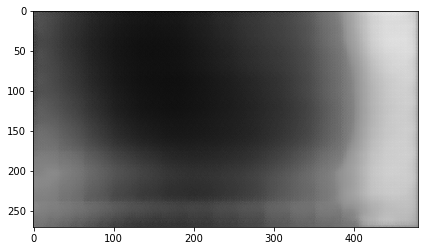

- Before encoding, mean: 0.510 var: 0.126
- After encoding, mean: -3.972 var: 5.901
- Before deconv, mean: -0.023 var: 2.345
- After deconv 7, mean: 0.375 var: 4.072
- After sigmoid, mean: 0.522 var: 0.091
Epoch: 4/10, Step: 51/69, Avg loss: 62898.117, time: 142.51, Avg. per iter 2.65, Est. time left 47.70

- Before encoding, mean: 0.413 var: 0.090
- After encoding, mean: -3.863 var: 6.648
- Before deconv, mean: -0.021 var: 2.108
- After deconv 7, mean: 0.097 var: 3.178
- After sigmoid, mean: 0.478 var: 0.070
Epoch: 4/10, Step: 52/69, Avg loss: 63001.480, time: 145.20, Avg. per iter 2.65, Est. time left 45.05

- Before encoding, mean: 0.540 var: 0.105
- After encoding, mean: -3.893 var: 5.986
- Before deconv, mean: -0.031 var: 2.107
- After deconv 7, mean: 0.056 var: 3.394
- After sigmoid, mean: 0.486 var: 0.085
Epoch: 4/10, Step: 53/69, Avg loss: 63024.789, time: 147.86, Avg. per iter 2.65, Est. time left 42.40

- Before encoding, mean: 0.473 var: 0.104
- After encoding, mean: -3.921 

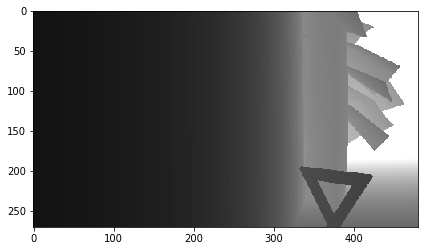

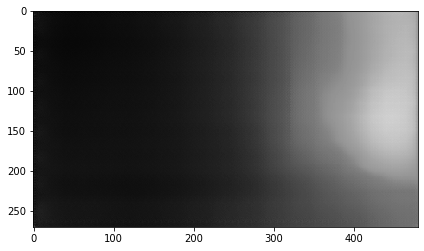

- Before encoding, mean: 0.543 var: 0.123
- After encoding, mean: -3.976 var: 5.800
- Before deconv, mean: -0.027 var: 2.335
- After deconv 7, mean: 0.207 var: 4.729
- After sigmoid, mean: 0.499 var: 0.108
Epoch: 4/10, Step: 61/69, Avg loss: 63013.883, time: 170.20, Avg. per iter 2.65, Est. time left 21.23

- Before encoding, mean: 0.472 var: 0.115
- After encoding, mean: -3.949 var: 6.228
- Before deconv, mean: -0.026 var: 2.027
- After deconv 7, mean: 0.140 var: 3.935
- After sigmoid, mean: 0.483 var: 0.096
Epoch: 4/10, Step: 62/69, Avg loss: 62188.656, time: 170.94, Avg. per iter 2.65, Est. time left 18.52

Loading tfrecords...
Done.
- Before encoding, mean: 0.590 var: 0.109
- After encoding, mean: -3.947 var: 5.531
- Before deconv, mean: -0.021 var: 2.127
- After deconv 7, mean: 0.637 var: 4.403
- After sigmoid, mean: 0.558 var: 0.093
Epoch: 5/10, Step: 1/69, Avg loss: 60627.648, time: 3.10, Avg. per iter 2.65, Est. time left 179.98

- Before encoding, mean: 0.527 var: 0.118
- Afte

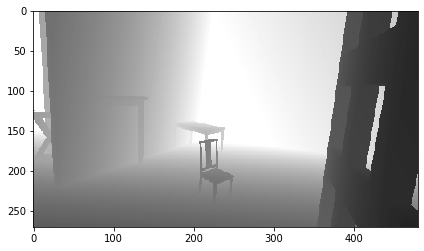

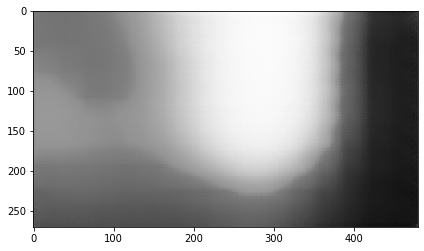

- Before encoding, mean: 0.472 var: 0.097
- After encoding, mean: -3.924 var: 5.652
- Before deconv, mean: -0.016 var: 2.108
- After deconv 7, mean: 0.054 var: 2.924
- After sigmoid, mean: 0.485 var: 0.072
Epoch: 5/10, Step: 11/69, Avg loss: 63389.816, time: 29.92, Avg. per iter 2.65, Est. time left 153.55

- Before encoding, mean: 0.483 var: 0.118
- After encoding, mean: -3.991 var: 6.342
- Before deconv, mean: -0.026 var: 1.995
- After deconv 7, mean: 0.104 var: 2.946
- After sigmoid, mean: 0.490 var: 0.081
Epoch: 5/10, Step: 12/69, Avg loss: 63093.777, time: 32.64, Avg. per iter 2.65, Est. time left 150.91

- Before encoding, mean: 0.459 var: 0.122
- After encoding, mean: -4.001 var: 6.706
- Before deconv, mean: -0.011 var: 2.288
- After deconv 7, mean: 0.204 var: 4.161
- After sigmoid, mean: 0.482 var: 0.087
Epoch: 5/10, Step: 13/69, Avg loss: 62672.332, time: 35.42, Avg. per iter 2.65, Est. time left 148.29

- Before encoding, mean: 0.535 var: 0.100
- After encoding, mean: -3.984 

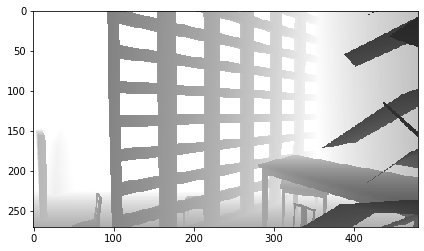

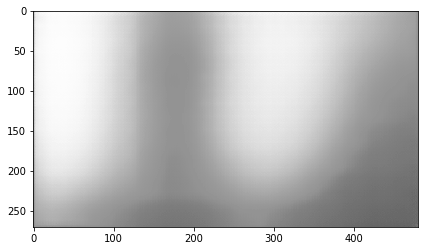

- Before encoding, mean: 0.408 var: 0.102
- After encoding, mean: -3.917 var: 6.297
- Before deconv, mean: -0.010 var: 1.861
- After deconv 7, mean: 0.275 var: 2.430
- After sigmoid, mean: 0.512 var: 0.055
Epoch: 5/10, Step: 21/69, Avg loss: 63650.316, time: 59.15, Avg. per iter 2.66, Est. time left 127.51

- Before encoding, mean: 0.463 var: 0.101
- After encoding, mean: -3.919 var: 6.590
- Before deconv, mean: -0.022 var: 1.840
- After deconv 7, mean: 0.413 var: 3.058
- After sigmoid, mean: 0.534 var: 0.071
Epoch: 5/10, Step: 22/69, Avg loss: 63756.402, time: 61.69, Avg. per iter 2.66, Est. time left 124.84

- Before encoding, mean: 0.453 var: 0.125
- After encoding, mean: -4.004 var: 6.070
- Before deconv, mean: -0.022 var: 2.143
- After deconv 7, mean: 0.140 var: 3.399
- After sigmoid, mean: 0.487 var: 0.084
Epoch: 5/10, Step: 23/69, Avg loss: 63543.301, time: 64.26, Avg. per iter 2.66, Est. time left 122.17

- Before encoding, mean: 0.512 var: 0.120
- After encoding, mean: -3.974 

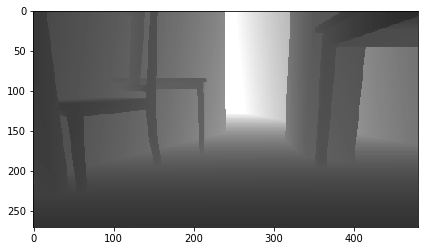

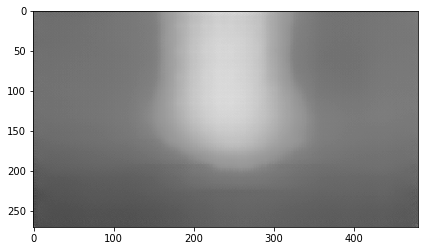

- Before encoding, mean: 0.493 var: 0.107
- After encoding, mean: -3.895 var: 6.137
- Before deconv, mean: -0.016 var: 2.109
- After deconv 7, mean: 0.410 var: 3.719
- After sigmoid, mean: 0.528 var: 0.078
Epoch: 5/10, Step: 31/69, Avg loss: 62823.016, time: 85.05, Avg. per iter 2.65, Est. time left 100.83

- Before encoding, mean: 0.499 var: 0.113
- After encoding, mean: -3.963 var: 5.928
- Before deconv, mean: -0.025 var: 2.077
- After deconv 7, mean: 0.075 var: 3.061
- After sigmoid, mean: 0.489 var: 0.082
Epoch: 5/10, Step: 32/69, Avg loss: 62824.148, time: 87.62, Avg. per iter 2.65, Est. time left 98.17

- Before encoding, mean: 0.396 var: 0.089
- After encoding, mean: -3.899 var: 6.645
- Before deconv, mean: -0.028 var: 2.216
- After deconv 7, mean: -0.367 var: 2.793
- After sigmoid, mean: 0.417 var: 0.071
Epoch: 5/10, Step: 33/69, Avg loss: 62900.457, time: 90.15, Avg. per iter 2.65, Est. time left 95.50

- Before encoding, mean: 0.484 var: 0.109
- After encoding, mean: -3.964 v

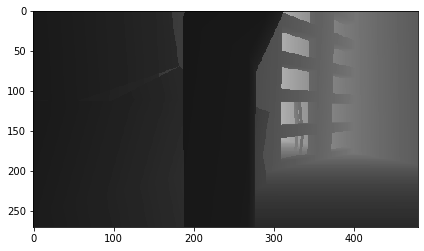

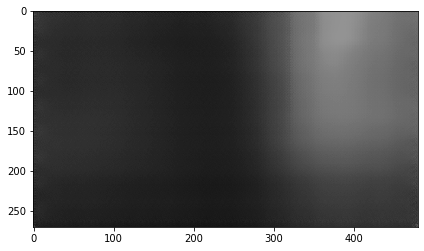

- Before encoding, mean: 0.457 var: 0.110
- After encoding, mean: -3.963 var: 6.875
- Before deconv, mean: -0.021 var: 2.284
- After deconv 7, mean: 0.095 var: 4.108
- After sigmoid, mean: 0.465 var: 0.086
Epoch: 5/10, Step: 41/69, Avg loss: 62977.047, time: 111.85, Avg. per iter 2.65, Est. time left 74.30

- Before encoding, mean: 0.385 var: 0.104
- After encoding, mean: -3.935 var: 6.642
- Before deconv, mean: -0.021 var: 2.501
- After deconv 7, mean: -0.122 var: 4.451
- After sigmoid, mean: 0.430 var: 0.086
Epoch: 5/10, Step: 42/69, Avg loss: 62942.184, time: 114.91, Avg. per iter 2.66, Est. time left 71.69

- Before encoding, mean: 0.513 var: 0.105
- After encoding, mean: -3.966 var: 6.361
- Before deconv, mean: -0.028 var: 2.561
- After deconv 7, mean: -0.295 var: 4.870
- After sigmoid, mean: 0.440 var: 0.103
Epoch: 5/10, Step: 43/69, Avg loss: 63045.426, time: 118.03, Avg. per iter 2.66, Est. time left 69.07

- Before encoding, mean: 0.524 var: 0.117
- After encoding, mean: -3.97

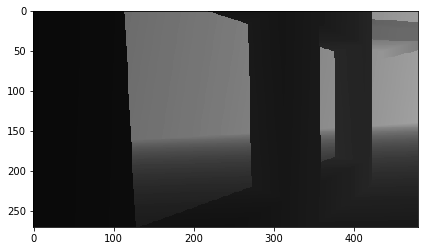

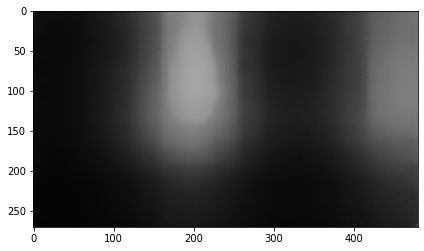

- Before encoding, mean: 0.427 var: 0.109
- After encoding, mean: -3.936 var: 6.425
- Before deconv, mean: -0.020 var: 2.661
- After deconv 7, mean: -0.339 var: 4.641
- After sigmoid, mean: 0.421 var: 0.094
Epoch: 5/10, Step: 51/69, Avg loss: 63035.613, time: 140.43, Avg. per iter 2.66, Est. time left 47.87

- Before encoding, mean: 0.529 var: 0.134
- After encoding, mean: -3.971 var: 6.878
- Before deconv, mean: -0.020 var: 3.047
- After deconv 7, mean: -0.306 var: 6.204
- After sigmoid, mean: 0.445 var: 0.126
Epoch: 5/10, Step: 52/69, Avg loss: 62941.145, time: 143.17, Avg. per iter 2.66, Est. time left 45.22

- Before encoding, mean: 0.512 var: 0.120
- After encoding, mean: -3.950 var: 6.026
- Before deconv, mean: -0.018 var: 2.715
- After deconv 7, mean: -0.078 var: 4.873
- After sigmoid, mean: 0.467 var: 0.102
Epoch: 5/10, Step: 53/69, Avg loss: 62929.855, time: 145.73, Avg. per iter 2.66, Est. time left 42.55

- Before encoding, mean: 0.537 var: 0.120
- After encoding, mean: -3.9

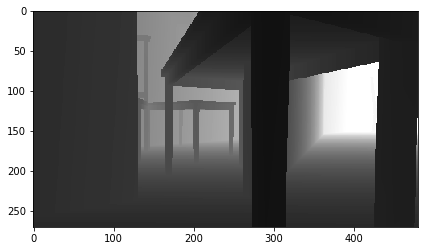

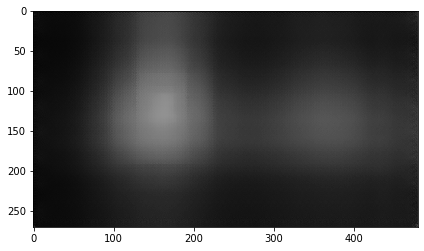

- Before encoding, mean: 0.484 var: 0.127
- After encoding, mean: -4.021 var: 6.447
- Before deconv, mean: -0.023 var: 2.814
- After deconv 7, mean: -0.089 var: 5.560
- After sigmoid, mean: 0.458 var: 0.115
Epoch: 5/10, Step: 61/69, Avg loss: 62788.504, time: 168.86, Avg. per iter 2.66, Est. time left 21.32

- Before encoding, mean: 0.489 var: 0.111
- After encoding, mean: -3.950 var: 6.427
- Before deconv, mean: -0.018 var: 2.939
- After deconv 7, mean: 0.097 var: 5.635
- After sigmoid, mean: 0.472 var: 0.099
Epoch: 5/10, Step: 62/69, Avg loss: 62793.770, time: 171.69, Avg. per iter 2.67, Est. time left 18.66

- Before encoding, mean: 0.478 var: 0.095
- After encoding, mean: -3.904 var: 6.343
- Before deconv, mean: -0.019 var: 2.335
- After deconv 7, mean: 0.180 var: 4.478
- After sigmoid, mean: 0.493 var: 0.091
Epoch: 5/10, Step: 63/69, Avg loss: 62897.898, time: 174.63, Avg. per iter 2.67, Est. time left 16.00

- Before encoding, mean: 0.520 var: 0.094
- After encoding, mean: -3.929

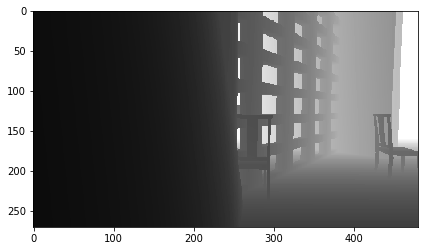

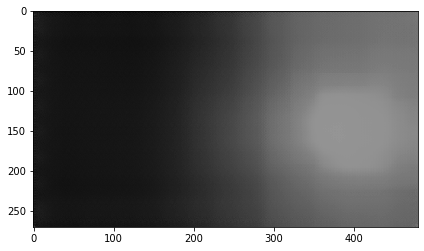

- Before encoding, mean: 0.445 var: 0.100
- After encoding, mean: -3.862 var: 6.438
- Before deconv, mean: -0.015 var: 2.113
- After deconv 7, mean: -0.095 var: 3.306
- After sigmoid, mean: 0.444 var: 0.071
Epoch: 6/10, Step: 11/69, Avg loss: 65558.781, time: 32.66, Avg. per iter 2.67, Est. time left 155.07

- Before encoding, mean: 0.390 var: 0.103
- After encoding, mean: -3.866 var: 7.296
- Before deconv, mean: -0.019 var: 2.076
- After deconv 7, mean: -0.113 var: 3.335
- After sigmoid, mean: 0.435 var: 0.070
Epoch: 6/10, Step: 12/69, Avg loss: 65262.621, time: 35.74, Avg. per iter 2.67, Est. time left 152.46

- Before encoding, mean: 0.510 var: 0.112
- After encoding, mean: -3.985 var: 6.456
- Before deconv, mean: -0.015 var: 2.450
- After deconv 7, mean: 0.149 var: 4.638
- After sigmoid, mean: 0.482 var: 0.096
Epoch: 6/10, Step: 13/69, Avg loss: 64946.379, time: 39.19, Avg. per iter 2.68, Est. time left 149.92

- Before encoding, mean: 0.448 var: 0.102
- After encoding, mean: -3.93

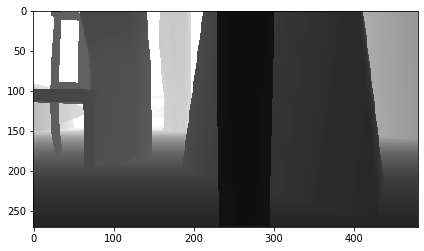

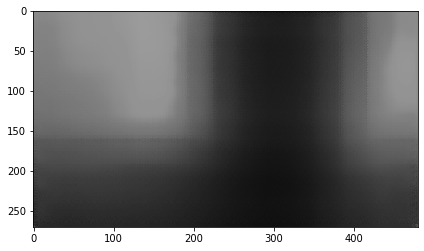

- Before encoding, mean: 0.447 var: 0.115
- After encoding, mean: -3.989 var: 7.292
- Before deconv, mean: -0.022 var: 1.870
- After deconv 7, mean: -0.112 var: 2.674
- After sigmoid, mean: 0.453 var: 0.079
Epoch: 6/10, Step: 21/69, Avg loss: 64497.582, time: 60.91, Avg. per iter 2.68, Est. time left 128.51

- Before encoding, mean: 0.481 var: 0.110
- After encoding, mean: -4.024 var: 6.504
- Before deconv, mean: -0.018 var: 2.105
- After deconv 7, mean: -0.024 var: 3.631
- After sigmoid, mean: 0.466 var: 0.090
Epoch: 6/10, Step: 22/69, Avg loss: 64323.910, time: 63.45, Avg. per iter 2.68, Est. time left 125.82

- Before encoding, mean: 0.401 var: 0.087
- After encoding, mean: -3.885 var: 7.048
- Before deconv, mean: -0.021 var: 1.950
- After deconv 7, mean: -0.211 var: 3.154
- After sigmoid, mean: 0.435 var: 0.080
Epoch: 6/10, Step: 23/69, Avg loss: 64488.219, time: 66.01, Avg. per iter 2.68, Est. time left 123.13

- Before encoding, mean: 0.464 var: 0.115
- After encoding, mean: -4.0

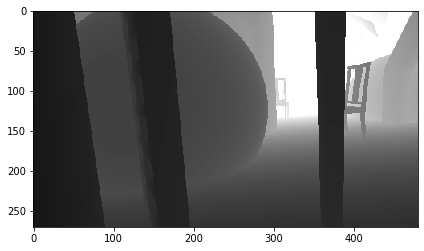

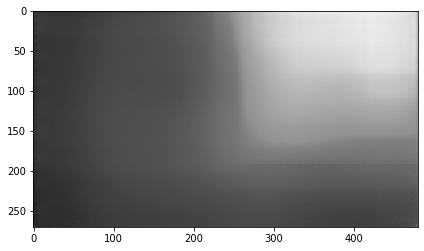

- Before encoding, mean: 0.440 var: 0.107
- After encoding, mean: -3.968 var: 6.895
- Before deconv, mean: -0.018 var: 2.237
- After deconv 7, mean: 0.070 var: 5.251
- After sigmoid, mean: 0.454 var: 0.091
Epoch: 6/10, Step: 31/69, Avg loss: 63558.254, time: 87.25, Avg. per iter 2.68, Est. time left 101.67

- Before encoding, mean: 0.446 var: 0.115
- After encoding, mean: -3.985 var: 7.141
- Before deconv, mean: -0.019 var: 2.444
- After deconv 7, mean: -0.199 var: 5.916
- After sigmoid, mean: 0.420 var: 0.105
Epoch: 6/10, Step: 32/69, Avg loss: 63407.473, time: 90.50, Avg. per iter 2.68, Est. time left 99.06

- Before encoding, mean: 0.470 var: 0.123
- After encoding, mean: -4.013 var: 7.245
- Before deconv, mean: -0.026 var: 2.403
- After deconv 7, mean: -0.247 var: 5.795
- After sigmoid, mean: 0.423 var: 0.112
Epoch: 6/10, Step: 33/69, Avg loss: 63255.004, time: 93.84, Avg. per iter 2.68, Est. time left 96.45

- Before encoding, mean: 0.405 var: 0.104
- After encoding, mean: -3.928 

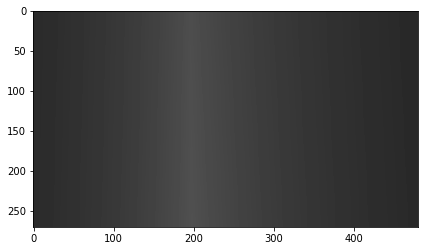

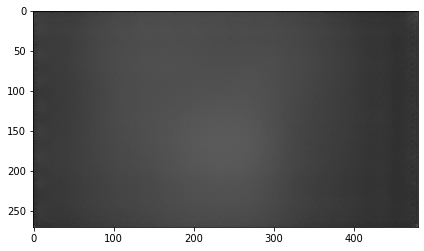

- Before encoding, mean: 0.475 var: 0.115
- After encoding, mean: -3.999 var: 7.134
- Before deconv, mean: -0.019 var: 2.121
- After deconv 7, mean: 0.021 var: 4.972
- After sigmoid, mean: 0.447 var: 0.099
Epoch: 6/10, Step: 41/69, Avg loss: 63331.531, time: 117.11, Avg. per iter 2.68, Est. time left 75.14

- Before encoding, mean: 0.544 var: 0.115
- After encoding, mean: -4.037 var: 6.163
- Before deconv, mean: -0.026 var: 2.304
- After deconv 7, mean: 0.106 var: 5.384
- After sigmoid, mean: 0.474 var: 0.103
Epoch: 6/10, Step: 42/69, Avg loss: 63314.660, time: 119.93, Avg. per iter 2.68, Est. time left 72.47

- Before encoding, mean: 0.517 var: 0.125
- After encoding, mean: -4.043 var: 6.251
- Before deconv, mean: -0.010 var: 2.458
- After deconv 7, mean: 0.388 var: 5.940
- After sigmoid, mean: 0.509 var: 0.109
Epoch: 6/10, Step: 43/69, Avg loss: 63151.211, time: 122.59, Avg. per iter 2.68, Est. time left 69.78

- Before encoding, mean: 0.530 var: 0.106
- After encoding, mean: -4.024 

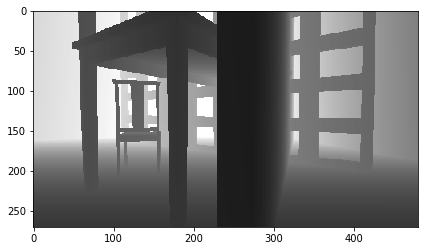

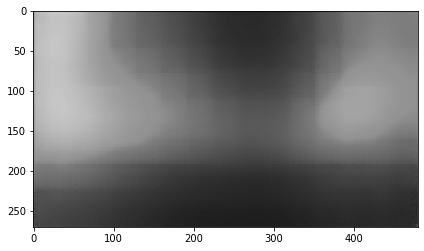

- Before encoding, mean: 0.419 var: 0.086
- After encoding, mean: -3.884 var: 5.897
- Before deconv, mean: -0.028 var: 1.785
- After deconv 7, mean: -0.433 var: 2.933
- After sigmoid, mean: 0.402 var: 0.075
Epoch: 6/10, Step: 51/69, Avg loss: 63161.793, time: 144.31, Avg. per iter 2.68, Est. time left 48.31

- Before encoding, mean: 0.405 var: 0.095
- After encoding, mean: -3.867 var: 5.836
- Before deconv, mean: -0.015 var: 1.714
- After deconv 7, mean: -0.108 var: 2.933
- After sigmoid, mean: 0.442 var: 0.068
Epoch: 6/10, Step: 52/69, Avg loss: 63231.566, time: 147.14, Avg. per iter 2.68, Est. time left 45.63

- Before encoding, mean: 0.456 var: 0.099
- After encoding, mean: -3.932 var: 5.619
- Before deconv, mean: -0.022 var: 1.976
- After deconv 7, mean: 0.062 var: 3.473
- After sigmoid, mean: 0.472 var: 0.075
Epoch: 6/10, Step: 53/69, Avg loss: 63281.207, time: 149.81, Avg. per iter 2.68, Est. time left 42.95

- Before encoding, mean: 0.555 var: 0.122
- After encoding, mean: -4.06

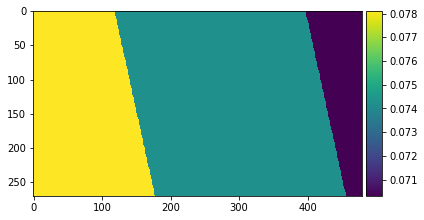

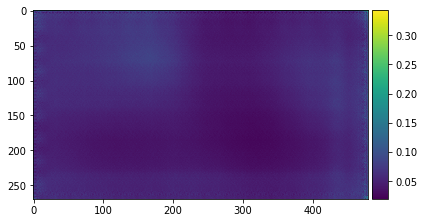

- Before encoding, mean: 0.507 var: 0.099
- After encoding, mean: -4.009 var: 6.308
- Before deconv, mean: -0.034 var: 2.175
- After deconv 7, mean: -0.098 var: 4.041
- After sigmoid, mean: 0.451 var: 0.091
Epoch: 6/10, Step: 61/69, Avg loss: 63165.902, time: 171.88, Avg. per iter 2.69, Est. time left 21.48

- Before encoding, mean: 0.432 var: 0.111
- After encoding, mean: -3.986 var: 7.177
- Before deconv, mean: -0.016 var: 1.953
- After deconv 7, mean: -0.035 var: 3.421
- After sigmoid, mean: 0.448 var: 0.081
Epoch: 6/10, Step: 62/69, Avg loss: 63127.402, time: 174.43, Avg. per iter 2.68, Est. time left 18.79

- Before encoding, mean: 0.416 var: 0.100
- After encoding, mean: -3.988 var: 6.595
- Before deconv, mean: -0.023 var: 1.858
- After deconv 7, mean: 0.009 var: 3.023
- After sigmoid, mean: 0.460 var: 0.074
Epoch: 6/10, Step: 63/69, Avg loss: 63153.809, time: 177.12, Avg. per iter 2.68, Est. time left 16.11

- Before encoding, mean: 0.478 var: 0.108
- After encoding, mean: -4.04

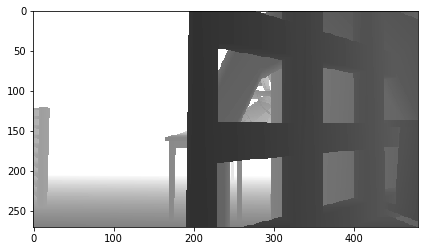

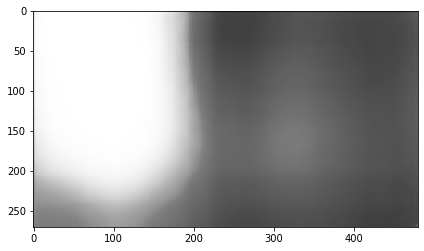

- Before encoding, mean: 0.491 var: 0.127
- After encoding, mean: -4.041 var: 6.306
- Before deconv, mean: -0.021 var: 2.187
- After deconv 7, mean: 0.018 var: 4.941
- After sigmoid, mean: 0.469 var: 0.104
Epoch: 7/10, Step: 11/69, Avg loss: 62814.551, time: 28.82, Avg. per iter 2.68, Est. time left 155.24

- Before encoding, mean: 0.453 var: 0.113
- After encoding, mean: -3.980 var: 6.475
- Before deconv, mean: -0.024 var: 1.961
- After deconv 7, mean: -0.274 var: 4.234
- After sigmoid, mean: 0.432 var: 0.095
Epoch: 7/10, Step: 12/69, Avg loss: 62559.301, time: 31.68, Avg. per iter 2.68, Est. time left 152.59

- Before encoding, mean: 0.521 var: 0.129
- After encoding, mean: -4.022 var: 6.121
- Before deconv, mean: -0.019 var: 2.254
- After deconv 7, mean: 0.004 var: 4.951
- After sigmoid, mean: 0.477 var: 0.107
Epoch: 7/10, Step: 13/69, Avg loss: 62163.855, time: 34.26, Avg. per iter 2.68, Est. time left 149.90

- Before encoding, mean: 0.525 var: 0.112
- After encoding, mean: -3.972

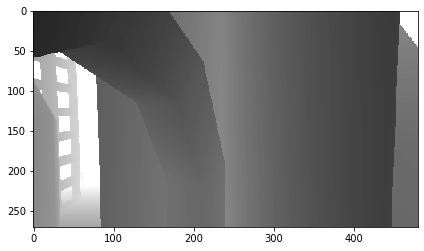

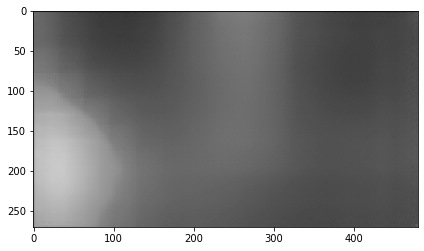

- Before encoding, mean: 0.500 var: 0.117
- After encoding, mean: -4.005 var: 5.789
- Before deconv, mean: -0.029 var: 1.926
- After deconv 7, mean: -0.118 var: 3.812
- After sigmoid, mean: 0.456 var: 0.093
Epoch: 7/10, Step: 21/69, Avg loss: 62049.500, time: 54.76, Avg. per iter 2.67, Est. time left 128.36

- Before encoding, mean: 0.406 var: 0.117
- After encoding, mean: -3.952 var: 6.778
- Before deconv, mean: -0.019 var: 1.870
- After deconv 7, mean: -0.106 var: 4.235
- After sigmoid, mean: 0.432 var: 0.092
Epoch: 7/10, Step: 22/69, Avg loss: 61759.012, time: 57.25, Avg. per iter 2.67, Est. time left 125.66

- Before encoding, mean: 0.469 var: 0.123
- After encoding, mean: -4.032 var: 5.906
- Before deconv, mean: -0.020 var: 2.197
- After deconv 7, mean: 0.069 var: 5.429
- After sigmoid, mean: 0.469 var: 0.109
Epoch: 7/10, Step: 23/69, Avg loss: 61521.000, time: 59.88, Avg. per iter 2.67, Est. time left 122.98

- Before encoding, mean: 0.438 var: 0.100
- After encoding, mean: -3.88

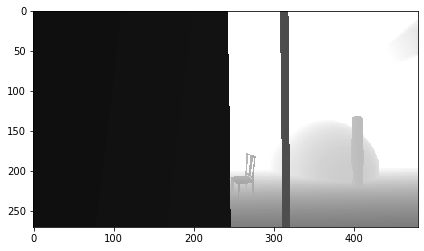

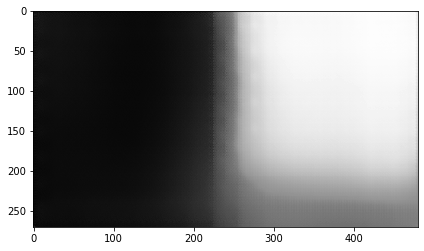

- Before encoding, mean: 0.446 var: 0.105
- After encoding, mean: -3.900 var: 5.948
- Before deconv, mean: -0.016 var: 1.788
- After deconv 7, mean: 0.246 var: 4.166
- After sigmoid, mean: 0.491 var: 0.082
Epoch: 7/10, Step: 31/69, Avg loss: 61304.141, time: 81.07, Avg. per iter 2.67, Est. time left 101.54

- Before encoding, mean: 0.473 var: 0.110
- After encoding, mean: -3.947 var: 5.662
- Before deconv, mean: -0.021 var: 1.813
- After deconv 7, mean: 0.270 var: 4.172
- After sigmoid, mean: 0.502 var: 0.086
Epoch: 7/10, Step: 32/69, Avg loss: 61354.562, time: 83.77, Avg. per iter 2.67, Est. time left 98.88

- Before encoding, mean: 0.563 var: 0.116
- After encoding, mean: -4.005 var: 4.874
- Before deconv, mean: -0.021 var: 1.987
- After deconv 7, mean: 0.558 var: 5.184
- After sigmoid, mean: 0.546 var: 0.102
Epoch: 7/10, Step: 33/69, Avg loss: 61284.613, time: 86.30, Avg. per iter 2.67, Est. time left 96.19

- Before encoding, mean: 0.526 var: 0.124
- After encoding, mean: -4.020 va

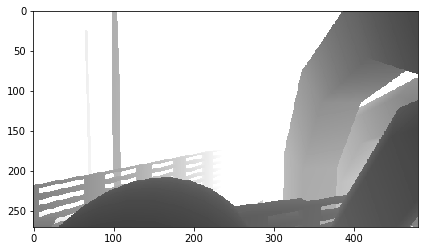

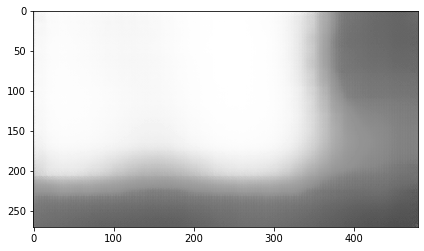

- Before encoding, mean: 0.414 var: 0.109
- After encoding, mean: -3.906 var: 6.324
- Before deconv, mean: -0.016 var: 1.792
- After deconv 7, mean: -0.002 var: 4.926
- After sigmoid, mean: 0.446 var: 0.088
Epoch: 7/10, Step: 41/69, Avg loss: 60873.426, time: 106.68, Avg. per iter 2.67, Est. time left 74.74

- Before encoding, mean: 0.459 var: 0.124
- After encoding, mean: -3.960 var: 6.513
- Before deconv, mean: -0.013 var: 1.843
- After deconv 7, mean: 0.157 var: 5.871
- After sigmoid, mean: 0.462 var: 0.106
Epoch: 7/10, Step: 42/69, Avg loss: 60752.547, time: 109.37, Avg. per iter 2.67, Est. time left 72.07

- Before encoding, mean: 0.472 var: 0.120
- After encoding, mean: -3.947 var: 5.860
- Before deconv, mean: -0.025 var: 1.800
- After deconv 7, mean: -0.029 var: 5.376
- After sigmoid, mean: 0.455 var: 0.103
Epoch: 7/10, Step: 43/69, Avg loss: 60697.930, time: 112.27, Avg. per iter 2.67, Est. time left 69.41

- Before encoding, mean: 0.469 var: 0.102
- After encoding, mean: -3.90

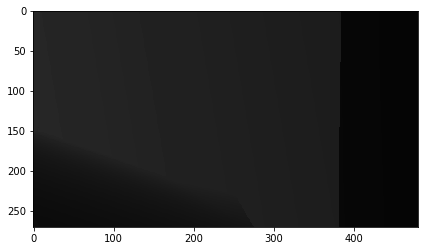

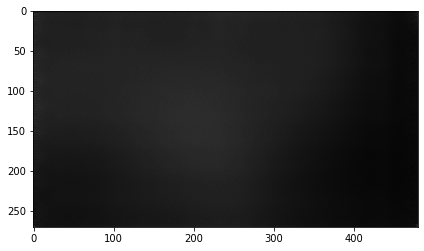

- Before encoding, mean: 0.441 var: 0.107
- After encoding, mean: -3.909 var: 6.329
- Before deconv, mean: -0.025 var: 1.424
- After deconv 7, mean: -0.324 var: 3.987
- After sigmoid, mean: 0.416 var: 0.089
Epoch: 7/10, Step: 51/69, Avg loss: 60768.031, time: 133.71, Avg. per iter 2.67, Est. time left 48.05

- Before encoding, mean: 0.423 var: 0.109
- After encoding, mean: -3.919 var: 6.510
- Before deconv, mean: -0.021 var: 1.603
- After deconv 7, mean: -0.180 var: 4.831
- After sigmoid, mean: 0.423 var: 0.096
Epoch: 7/10, Step: 52/69, Avg loss: 60751.246, time: 136.43, Avg. per iter 2.67, Est. time left 45.38

- Before encoding, mean: 0.477 var: 0.111
- After encoding, mean: -3.988 var: 5.869
- Before deconv, mean: -0.019 var: 1.808
- After deconv 7, mean: 0.150 var: 6.116
- After sigmoid, mean: 0.474 var: 0.105
Epoch: 7/10, Step: 53/69, Avg loss: 60749.707, time: 139.25, Avg. per iter 2.67, Est. time left 42.72

- Before encoding, mean: 0.399 var: 0.108
- After encoding, mean: -3.94

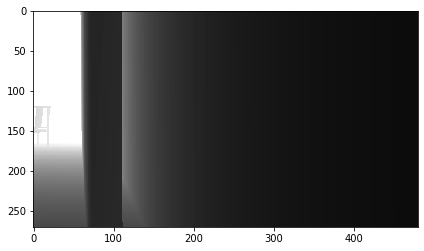

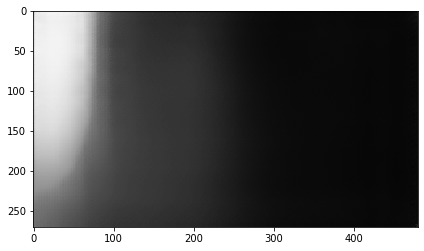

- Before encoding, mean: 0.521 var: 0.127
- After encoding, mean: -4.086 var: 5.760
- Before deconv, mean: -0.023 var: 1.646
- After deconv 7, mean: 0.296 var: 5.255
- After sigmoid, mean: 0.513 var: 0.109
Epoch: 8/10, Step: 11/69, Avg loss: 58149.535, time: 28.89, Avg. per iter 2.66, Est. time left 154.51

- Before encoding, mean: 0.327 var: 0.080
- After encoding, mean: -3.720 var: 7.514
- Before deconv, mean: -0.022 var: 1.294
- After deconv 7, mean: -0.572 var: 3.420
- After sigmoid, mean: 0.362 var: 0.071
Epoch: 8/10, Step: 12/69, Avg loss: 58485.938, time: 31.38, Avg. per iter 2.66, Est. time left 151.82

- Before encoding, mean: 0.448 var: 0.119
- After encoding, mean: -4.017 var: 6.153
- Before deconv, mean: -0.024 var: 1.627
- After deconv 7, mean: -0.284 var: 5.924
- After sigmoid, mean: 0.407 var: 0.107
Epoch: 8/10, Step: 13/69, Avg loss: 58435.750, time: 33.89, Avg. per iter 2.66, Est. time left 149.14

- Before encoding, mean: 0.424 var: 0.083
- After encoding, mean: -3.77

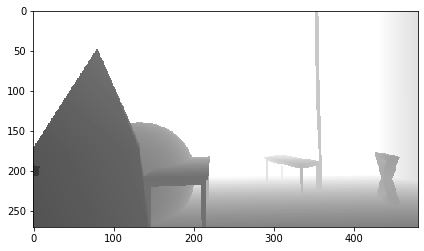

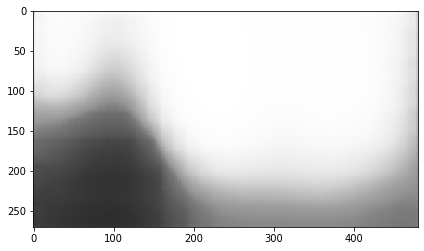

- Before encoding, mean: 0.447 var: 0.096
- After encoding, mean: -3.896 var: 6.161
- Before deconv, mean: -0.029 var: 1.596
- After deconv 7, mean: -0.145 var: 4.791
- After sigmoid, mean: 0.433 var: 0.087
Epoch: 8/10, Step: 21/69, Avg loss: 59537.758, time: 55.21, Avg. per iter 2.66, Est. time left 127.81

- Before encoding, mean: 0.448 var: 0.095
- After encoding, mean: -3.879 var: 5.892
- Before deconv, mean: -0.024 var: 1.505
- After deconv 7, mean: 0.019 var: 3.685
- After sigmoid, mean: 0.470 var: 0.077
Epoch: 8/10, Step: 22/69, Avg loss: 59900.941, time: 58.00, Avg. per iter 2.66, Est. time left 125.16

- Before encoding, mean: 0.472 var: 0.103
- After encoding, mean: -3.959 var: 6.124
- Before deconv, mean: -0.019 var: 1.321
- After deconv 7, mean: 0.145 var: 3.600
- After sigmoid, mean: 0.486 var: 0.081
Epoch: 8/10, Step: 23/69, Avg loss: 60054.141, time: 60.88, Avg. per iter 2.66, Est. time left 122.52

- Before encoding, mean: 0.528 var: 0.118
- After encoding, mean: -3.988

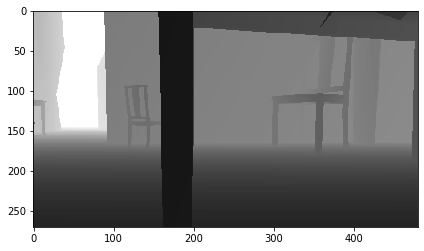

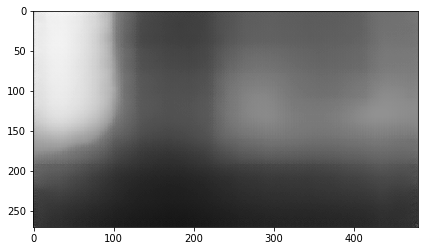

- Before encoding, mean: 0.448 var: 0.110
- After encoding, mean: -4.042 var: 6.761
- Before deconv, mean: -0.020 var: 1.621
- After deconv 7, mean: -0.052 var: 4.849
- After sigmoid, mean: 0.433 var: 0.091
Epoch: 8/10, Step: 31/69, Avg loss: 60263.859, time: 83.43, Avg. per iter 2.67, Est. time left 101.30

- Before encoding, mean: 0.468 var: 0.104
- After encoding, mean: -4.035 var: 6.135
- Before deconv, mean: -0.026 var: 1.648
- After deconv 7, mean: 0.206 var: 4.512
- After sigmoid, mean: 0.480 var: 0.083
Epoch: 8/10, Step: 32/69, Avg loss: 60349.113, time: 86.01, Avg. per iter 2.67, Est. time left 98.62

- Before encoding, mean: 0.423 var: 0.098
- After encoding, mean: -3.989 var: 6.848
- Before deconv, mean: -0.027 var: 1.378
- After deconv 7, mean: 0.131 var: 3.430
- After sigmoid, mean: 0.477 var: 0.077
Epoch: 8/10, Step: 33/69, Avg loss: 60486.770, time: 88.75, Avg. per iter 2.67, Est. time left 95.96

- Before encoding, mean: 0.393 var: 0.089
- After encoding, mean: -3.931 v

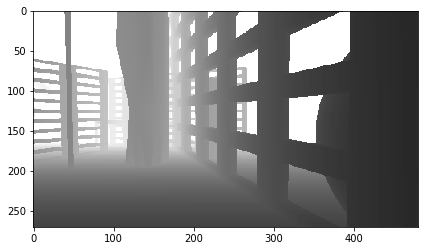

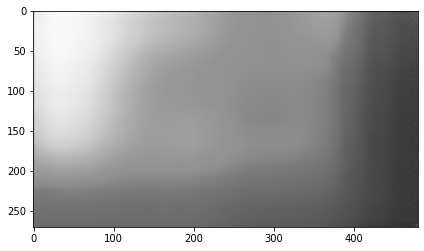

- Before encoding, mean: 0.478 var: 0.119
- After encoding, mean: -3.972 var: 6.489
- Before deconv, mean: -0.012 var: 1.615
- After deconv 7, mean: 0.777 var: 4.126
- After sigmoid, mean: 0.574 var: 0.071
Epoch: 8/10, Step: 41/69, Avg loss: 60777.414, time: 111.29, Avg. per iter 2.67, Est. time left 74.70

- Before encoding, mean: 0.427 var: 0.100
- After encoding, mean: -3.954 var: 6.506
- Before deconv, mean: -0.020 var: 1.565
- After deconv 7, mean: 0.307 var: 2.585
- After sigmoid, mean: 0.524 var: 0.061
Epoch: 8/10, Step: 42/69, Avg loss: 60943.309, time: 114.11, Avg. per iter 2.67, Est. time left 72.04

- Before encoding, mean: 0.435 var: 0.108
- After encoding, mean: -4.031 var: 6.559
- Before deconv, mean: -0.015 var: 1.698
- After deconv 7, mean: 0.051 var: 2.629
- After sigmoid, mean: 0.484 var: 0.069
Epoch: 8/10, Step: 43/69, Avg loss: 60987.273, time: 116.69, Avg. per iter 2.67, Est. time left 69.36

- Before encoding, mean: 0.399 var: 0.122
- After encoding, mean: -4.051 

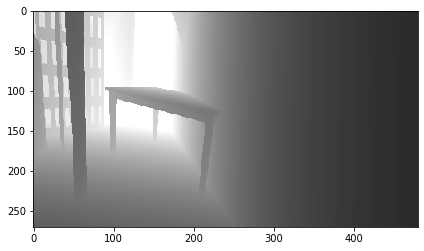

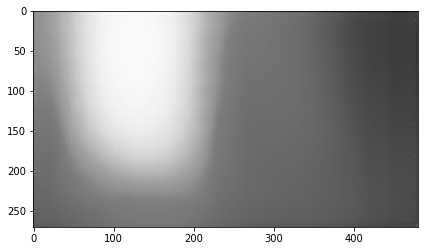

- Before encoding, mean: 0.415 var: 0.103
- After encoding, mean: -3.971 var: 7.101
- Before deconv, mean: -0.025 var: 1.837
- After deconv 7, mean: 0.087 var: 3.081
- After sigmoid, mean: 0.472 var: 0.067
Epoch: 8/10, Step: 51/69, Avg loss: 61252.691, time: 138.65, Avg. per iter 2.67, Est. time left 48.04

- Before encoding, mean: 0.425 var: 0.122
- After encoding, mean: -3.958 var: 8.022
- Before deconv, mean: -0.014 var: 2.246
- After deconv 7, mean: 0.136 var: 5.150
- After sigmoid, mean: 0.450 var: 0.084
Epoch: 8/10, Step: 52/69, Avg loss: 61160.707, time: 141.48, Avg. per iter 2.67, Est. time left 45.37

- Before encoding, mean: 0.402 var: 0.103
- After encoding, mean: -3.907 var: 7.934
- Before deconv, mean: -0.035 var: 2.096
- After deconv 7, mean: -0.591 var: 3.637
- After sigmoid, mean: 0.377 var: 0.083
Epoch: 8/10, Step: 53/69, Avg loss: 61164.633, time: 144.24, Avg. per iter 2.67, Est. time left 42.71

- Before encoding, mean: 0.397 var: 0.114
- After encoding, mean: -3.966

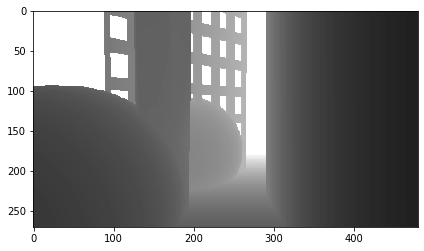

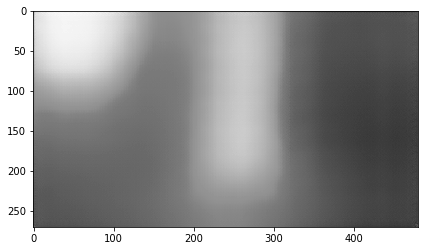

- Before encoding, mean: 0.478 var: 0.098
- After encoding, mean: -3.972 var: 6.231
- Before deconv, mean: -0.025 var: 2.163
- After deconv 7, mean: 0.040 var: 2.536
- After sigmoid, mean: 0.490 var: 0.069
Epoch: 8/10, Step: 61/69, Avg loss: 61358.309, time: 168.21, Avg. per iter 2.67, Est. time left 21.39

- Before encoding, mean: 0.465 var: 0.109
- After encoding, mean: -4.040 var: 6.702
- Before deconv, mean: -0.020 var: 2.227
- After deconv 7, mean: -0.077 var: 3.550
- After sigmoid, mean: 0.465 var: 0.086
Epoch: 8/10, Step: 62/69, Avg loss: 61252.645, time: 170.68, Avg. per iter 2.67, Est. time left 18.71

Loading tfrecords...
Done.
- Before encoding, mean: 0.528 var: 0.107
- After encoding, mean: -4.000 var: 6.381
- Before deconv, mean: -0.025 var: 2.375
- After deconv 7, mean: -0.122 var: 4.269
- After sigmoid, mean: 0.468 var: 0.097
Epoch: 9/10, Step: 1/69, Avg loss: 65849.188, time: 3.07, Avg. per iter 2.67, Est. time left 181.80

- Before encoding, mean: 0.548 var: 0.109
- Af

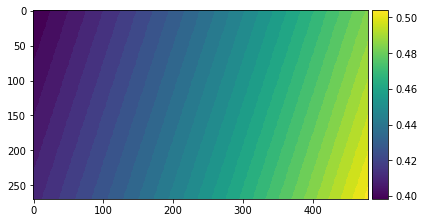

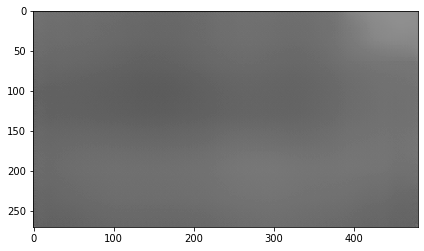

- Before encoding, mean: 0.478 var: 0.132
- After encoding, mean: -4.080 var: 7.979
- Before deconv, mean: -0.013 var: 2.724
- After deconv 7, mean: 0.409 var: 5.751
- After sigmoid, mean: 0.500 var: 0.105
Epoch: 9/10, Step: 11/69, Avg loss: 61876.102, time: 30.38, Avg. per iter 2.67, Est. time left 155.11

- Before encoding, mean: 0.449 var: 0.131
- After encoding, mean: -4.066 var: 8.107
- Before deconv, mean: -0.005 var: 2.688
- After deconv 7, mean: 0.524 var: 7.096
- After sigmoid, mean: 0.495 var: 0.111
Epoch: 9/10, Step: 12/69, Avg loss: 61108.156, time: 33.04, Avg. per iter 2.67, Est. time left 152.43

- Before encoding, mean: 0.493 var: 0.116
- After encoding, mean: -4.049 var: 7.002
- Before deconv, mean: -0.021 var: 2.639
- After deconv 7, mean: 0.330 var: 5.542
- After sigmoid, mean: 0.506 var: 0.104
Epoch: 9/10, Step: 13/69, Avg loss: 61123.961, time: 35.74, Avg. per iter 2.67, Est. time left 149.76

- Before encoding, mean: 0.475 var: 0.111
- After encoding, mean: -4.015 

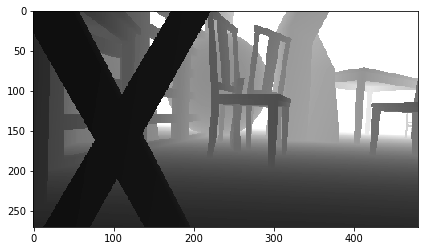

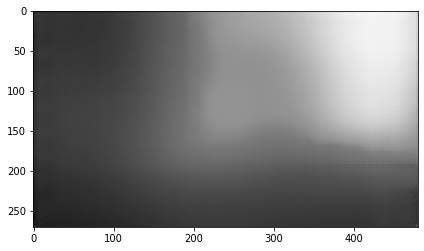

- Before encoding, mean: 0.500 var: 0.124
- After encoding, mean: -4.099 var: 6.695
- Before deconv, mean: -0.008 var: 2.616
- After deconv 7, mean: 0.551 var: 6.149
- After sigmoid, mean: 0.516 var: 0.100
Epoch: 9/10, Step: 21/69, Avg loss: 60959.816, time: 56.68, Avg. per iter 2.67, Est. time left 128.31

- Before encoding, mean: 0.525 var: 0.108
- After encoding, mean: -4.054 var: 6.987
- Before deconv, mean: -0.008 var: 2.709
- After deconv 7, mean: 0.645 var: 7.966
- After sigmoid, mean: 0.512 var: 0.114
Epoch: 9/10, Step: 22/69, Avg loss: 60875.602, time: 59.31, Avg. per iter 2.67, Est. time left 125.63

- Before encoding, mean: 0.506 var: 0.097
- After encoding, mean: -3.956 var: 7.280
- Before deconv, mean: -0.020 var: 2.299
- After deconv 7, mean: 0.405 var: 6.435
- After sigmoid, mean: 0.493 var: 0.101
Epoch: 9/10, Step: 23/69, Avg loss: 61138.000, time: 62.10, Avg. per iter 2.67, Est. time left 122.97

- Before encoding, mean: 0.485 var: 0.117
- After encoding, mean: -4.020 

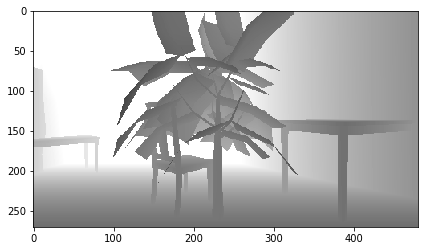

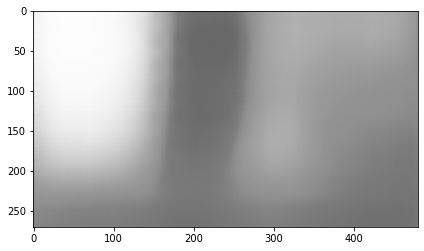

- Before encoding, mean: 0.468 var: 0.110
- After encoding, mean: -4.053 var: 6.906
- Before deconv, mean: -0.017 var: 2.048
- After deconv 7, mean: 0.178 var: 4.850
- After sigmoid, mean: 0.481 var: 0.094
Epoch: 9/10, Step: 31/69, Avg loss: 61092.527, time: 83.72, Avg. per iter 2.67, Est. time left 101.58

- Before encoding, mean: 0.428 var: 0.103
- After encoding, mean: -3.976 var: 7.419
- Before deconv, mean: -0.015 var: 2.078
- After deconv 7, mean: 0.228 var: 5.016
- After sigmoid, mean: 0.479 var: 0.089
Epoch: 9/10, Step: 32/69, Avg loss: 61157.113, time: 86.37, Avg. per iter 2.67, Est. time left 98.91

- Before encoding, mean: 0.485 var: 0.112
- After encoding, mean: -4.035 var: 6.609
- Before deconv, mean: -0.022 var: 2.100
- After deconv 7, mean: 0.371 var: 5.028
- After sigmoid, mean: 0.510 var: 0.096
Epoch: 9/10, Step: 33/69, Avg loss: 61130.027, time: 89.01, Avg. per iter 2.67, Est. time left 96.23

- Before encoding, mean: 0.557 var: 0.111
- After encoding, mean: -4.059 va

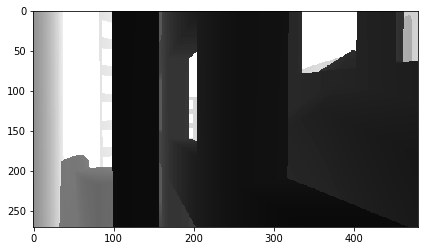

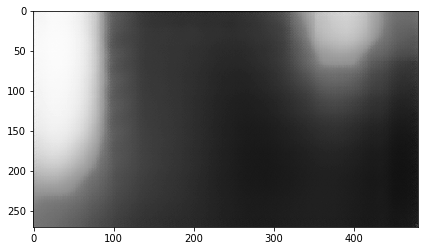

- Before encoding, mean: 0.413 var: 0.100
- After encoding, mean: -4.007 var: 6.970
- Before deconv, mean: -0.017 var: 1.959
- After deconv 7, mean: -0.192 var: 4.970
- After sigmoid, mean: 0.424 var: 0.095
Epoch: 9/10, Step: 41/69, Avg loss: 61197.270, time: 110.73, Avg. per iter 2.67, Est. time left 74.85

- Before encoding, mean: 0.484 var: 0.109
- After encoding, mean: -4.012 var: 6.523
- Before deconv, mean: -0.024 var: 2.048
- After deconv 7, mean: -0.029 var: 5.427
- After sigmoid, mean: 0.450 var: 0.105
Epoch: 9/10, Step: 42/69, Avg loss: 61204.613, time: 113.42, Avg. per iter 2.67, Est. time left 72.18

- Before encoding, mean: 0.519 var: 0.113
- After encoding, mean: -4.040 var: 6.559
- Before deconv, mean: -0.018 var: 2.053
- After deconv 7, mean: 0.200 var: 5.644
- After sigmoid, mean: 0.478 var: 0.106
Epoch: 9/10, Step: 43/69, Avg loss: 61162.559, time: 116.04, Avg. per iter 2.67, Est. time left 69.50

- Before encoding, mean: 0.525 var: 0.118
- After encoding, mean: -4.01

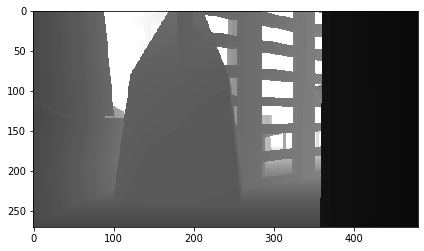

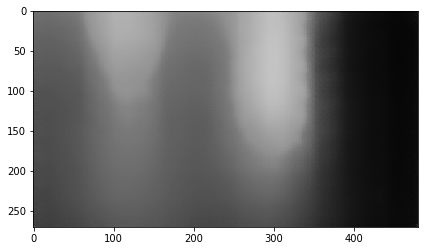

- Before encoding, mean: 0.358 var: 0.070
- After encoding, mean: -3.757 var: 7.757
- Before deconv, mean: -0.023 var: 1.548
- After deconv 7, mean: -0.574 var: 2.979
- After sigmoid, mean: 0.387 var: 0.073
Epoch: 9/10, Step: 51/69, Avg loss: 61232.828, time: 137.55, Avg. per iter 2.67, Est. time left 48.12

- Before encoding, mean: 0.480 var: 0.118
- After encoding, mean: -4.038 var: 7.096
- Before deconv, mean: -0.015 var: 2.001
- After deconv 7, mean: 0.012 var: 5.474
- After sigmoid, mean: 0.458 var: 0.105
Epoch: 9/10, Step: 52/69, Avg loss: 61181.996, time: 140.23, Avg. per iter 2.67, Est. time left 45.44

- Before encoding, mean: 0.465 var: 0.103
- After encoding, mean: -3.959 var: 6.600
- Before deconv, mean: -0.026 var: 1.523
- After deconv 7, mean: -0.136 var: 3.478
- After sigmoid, mean: 0.455 var: 0.086
Epoch: 9/10, Step: 53/69, Avg loss: 61221.820, time: 142.91, Avg. per iter 2.67, Est. time left 42.77

- Before encoding, mean: 0.475 var: 0.096
- After encoding, mean: -3.94

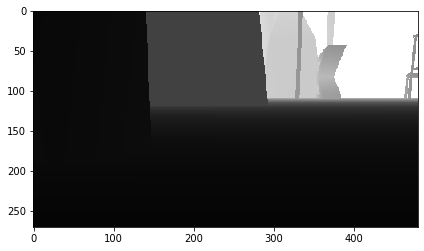

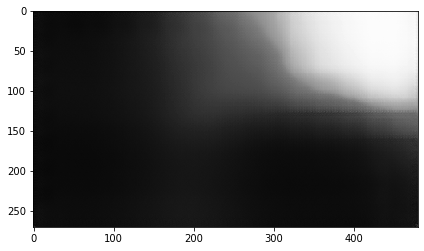

- Before encoding, mean: 0.434 var: 0.115
- After encoding, mean: -3.995 var: 8.352
- Before deconv, mean: -0.008 var: 1.845
- After deconv 7, mean: 0.281 var: 7.459
- After sigmoid, mean: 0.447 var: 0.099
Epoch: 9/10, Step: 61/69, Avg loss: 61083.992, time: 164.54, Avg. per iter 2.67, Est. time left 21.39

- Before encoding, mean: 0.421 var: 0.107
- After encoding, mean: -4.001 var: 6.723
- Before deconv, mean: -0.017 var: 1.545
- After deconv 7, mean: -0.118 var: 3.862
- After sigmoid, mean: 0.444 var: 0.087
Epoch: 9/10, Step: 62/69, Avg loss: 61098.602, time: 167.33, Avg. per iter 2.67, Est. time left 18.71

- Before encoding, mean: 0.481 var: 0.113
- After encoding, mean: -4.011 var: 6.678
- Before deconv, mean: -0.015 var: 1.720
- After deconv 7, mean: 0.052 var: 4.599
- After sigmoid, mean: 0.470 var: 0.098
Epoch: 9/10, Step: 63/69, Avg loss: 61099.844, time: 169.97, Avg. per iter 2.67, Est. time left 16.04

- Before encoding, mean: 0.501 var: 0.124
- After encoding, mean: -4.068

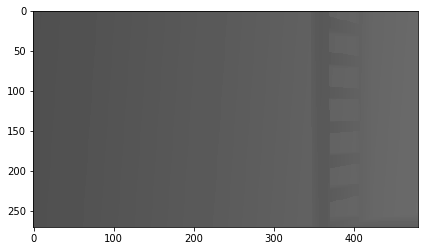

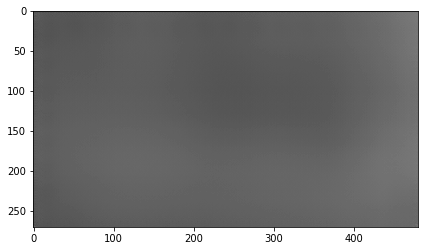

- Before encoding, mean: 0.448 var: 0.123
- After encoding, mean: -4.134 var: 7.867
- Before deconv, mean: -0.012 var: 1.458
- After deconv 7, mean: 0.185 var: 3.708
- After sigmoid, mean: 0.484 var: 0.084
Epoch: 10/10, Step: 11/69, Avg loss: 61690.922, time: 29.87, Avg. per iter 2.67, Est. time left 154.87

- Before encoding, mean: 0.494 var: 0.115
- After encoding, mean: -4.111 var: 7.490
- Before deconv, mean: -0.016 var: 1.563
- After deconv 7, mean: 0.225 var: 4.934
- After sigmoid, mean: 0.486 var: 0.097
Epoch: 10/10, Step: 12/69, Avg loss: 61504.418, time: 32.91, Avg. per iter 2.67, Est. time left 152.23

- Before encoding, mean: 0.442 var: 0.099
- After encoding, mean: -4.013 var: 8.133
- Before deconv, mean: -0.019 var: 1.420
- After deconv 7, mean: -0.190 var: 4.474
- After sigmoid, mean: 0.428 var: 0.097
Epoch: 10/10, Step: 13/69, Avg loss: 61686.992, time: 35.47, Avg. per iter 2.67, Est. time left 149.55

- Before encoding, mean: 0.517 var: 0.097
- After encoding, mean: -4.

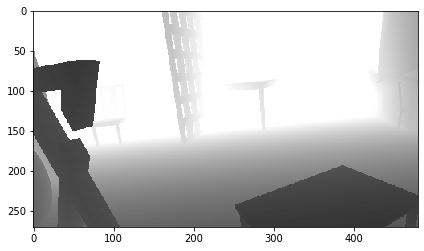

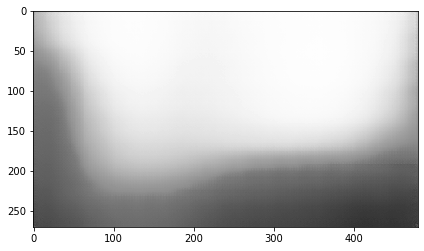

- Before encoding, mean: 0.425 var: 0.102
- After encoding, mean: -4.060 var: 7.855
- Before deconv, mean: -0.014 var: 1.675
- After deconv 7, mean: -0.108 var: 4.164
- After sigmoid, mean: 0.435 var: 0.083
Epoch: 10/10, Step: 21/69, Avg loss: 61663.238, time: 56.84, Avg. per iter 2.67, Est. time left 128.17

- Before encoding, mean: 0.490 var: 0.103
- After encoding, mean: -4.071 var: 7.810
- Before deconv, mean: -0.017 var: 1.649
- After deconv 7, mean: 0.214 var: 5.562
- After sigmoid, mean: 0.475 var: 0.096
Epoch: 10/10, Step: 22/69, Avg loss: 61754.438, time: 59.41, Avg. per iter 2.67, Est. time left 125.49

- Before encoding, mean: 0.472 var: 0.109
- After encoding, mean: -4.137 var: 6.931
- Before deconv, mean: -0.021 var: 1.658
- After deconv 7, mean: 0.171 var: 5.314
- After sigmoid, mean: 0.479 var: 0.100
Epoch: 10/10, Step: 23/69, Avg loss: 61735.227, time: 61.98, Avg. per iter 2.67, Est. time left 122.82

- Before encoding, mean: 0.527 var: 0.137
- After encoding, mean: -4.

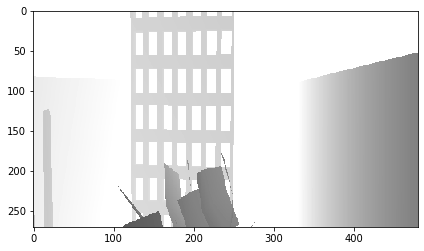

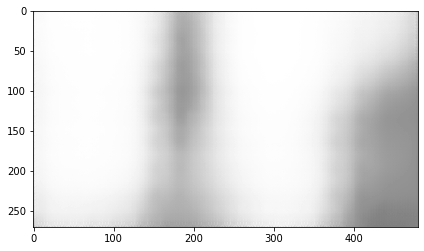

- Before encoding, mean: 0.422 var: 0.120
- After encoding, mean: -4.112 var: 8.237
- Before deconv, mean: -0.018 var: 1.528
- After deconv 7, mean: -0.085 var: 5.588
- After sigmoid, mean: 0.432 var: 0.109
Epoch: 10/10, Step: 31/69, Avg loss: 60547.695, time: 83.07, Avg. per iter 2.67, Est. time left 101.43

- Before encoding, mean: 0.438 var: 0.095
- After encoding, mean: -4.061 var: 7.034
- Before deconv, mean: -0.021 var: 1.505
- After deconv 7, mean: -0.286 var: 4.192
- After sigmoid, mean: 0.425 var: 0.087
Epoch: 10/10, Step: 32/69, Avg loss: 60712.621, time: 85.65, Avg. per iter 2.67, Est. time left 98.75

- Before encoding, mean: 0.545 var: 0.118
- After encoding, mean: -4.152 var: 6.727
- Before deconv, mean: -0.016 var: 1.732
- After deconv 7, mean: 0.374 var: 6.191
- After sigmoid, mean: 0.513 var: 0.112
Epoch: 10/10, Step: 33/69, Avg loss: 60628.062, time: 88.21, Avg. per iter 2.67, Est. time left 96.08

- Before encoding, mean: 0.396 var: 0.093
- After encoding, mean: -3.9

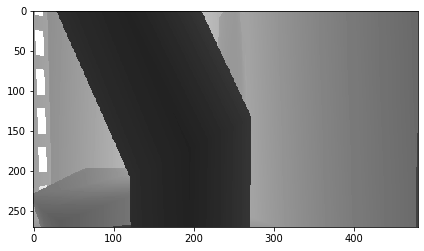

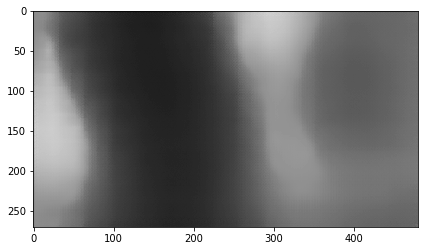

- Before encoding, mean: 0.467 var: 0.100
- After encoding, mean: -4.062 var: 6.902
- Before deconv, mean: -0.019 var: 1.264
- After deconv 7, mean: -0.017 var: 3.732
- After sigmoid, mean: 0.467 var: 0.090
Epoch: 10/10, Step: 41/69, Avg loss: 61069.605, time: 109.76, Avg. per iter 2.67, Est. time left 74.73

- Before encoding, mean: 0.410 var: 0.102
- After encoding, mean: -4.028 var: 7.670
- Before deconv, mean: -0.011 var: 1.280
- After deconv 7, mean: -0.190 var: 3.504
- After sigmoid, mean: 0.426 var: 0.079
Epoch: 10/10, Step: 42/69, Avg loss: 61065.262, time: 112.72, Avg. per iter 2.67, Est. time left 72.07

- Before encoding, mean: 0.461 var: 0.115
- After encoding, mean: -4.071 var: 7.322
- Before deconv, mean: -0.011 var: 1.417
- After deconv 7, mean: 0.081 var: 4.455
- After sigmoid, mean: 0.462 var: 0.092
Epoch: 10/10, Step: 43/69, Avg loss: 61047.465, time: 115.29, Avg. per iter 2.67, Est. time left 69.40

- Before encoding, mean: 0.505 var: 0.111
- After encoding, mean: -4

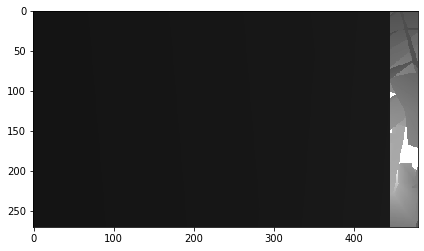

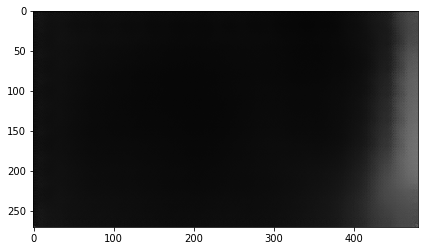

- Before encoding, mean: 0.456 var: 0.096
- After encoding, mean: -3.976 var: 7.096
- Before deconv, mean: -0.019 var: 1.340
- After deconv 7, mean: -0.133 var: 3.421
- After sigmoid, mean: 0.446 var: 0.080
Epoch: 10/10, Step: 51/69, Avg loss: 61004.148, time: 136.06, Avg. per iter 2.67, Est. time left 48.02

- Before encoding, mean: 0.529 var: 0.116
- After encoding, mean: -4.182 var: 6.267
- Before deconv, mean: -0.019 var: 1.202
- After deconv 7, mean: 0.496 var: 3.951
- After sigmoid, mean: 0.543 var: 0.092
Epoch: 10/10, Step: 52/69, Avg loss: 60946.105, time: 138.63, Avg. per iter 2.67, Est. time left 45.35

- Before encoding, mean: 0.456 var: 0.118
- After encoding, mean: -4.054 var: 6.955
- Before deconv, mean: -0.017 var: 1.269
- After deconv 7, mean: 0.198 var: 4.446
- After sigmoid, mean: 0.478 var: 0.087
Epoch: 10/10, Step: 53/69, Avg loss: 60907.539, time: 141.26, Avg. per iter 2.67, Est. time left 42.68

- Before encoding, mean: 0.468 var: 0.119
- After encoding, mean: -4.

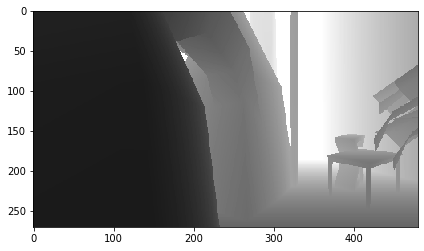

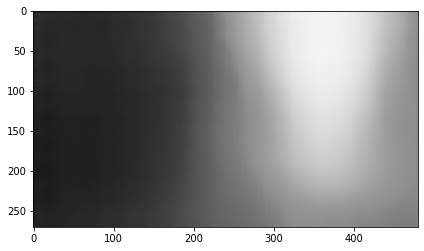

- Before encoding, mean: 0.487 var: 0.124
- After encoding, mean: -4.189 var: 6.827
- Before deconv, mean: -0.018 var: 1.335
- After deconv 7, mean: 0.303 var: 4.407
- After sigmoid, mean: 0.504 var: 0.092
Epoch: 10/10, Step: 61/69, Avg loss: 60599.836, time: 161.77, Avg. per iter 2.67, Est. time left 21.33

- Before encoding, mean: 0.471 var: 0.111
- After encoding, mean: -4.148 var: 6.810
- Before deconv, mean: -0.015 var: 1.395
- After deconv 7, mean: 0.087 var: 4.513
- After sigmoid, mean: 0.474 var: 0.093
Epoch: 10/10, Step: 62/69, Avg loss: 60594.391, time: 164.31, Avg. per iter 2.67, Est. time left 18.66

- Before encoding, mean: 0.557 var: 0.100
- After encoding, mean: -4.117 var: 6.285
- Before deconv, mean: -0.024 var: 1.610
- After deconv 7, mean: 0.350 var: 5.301
- After sigmoid, mean: 0.514 var: 0.099
Epoch: 10/10, Step: 63/69, Avg loss: 60651.836, time: 166.84, Avg. per iter 2.67, Est. time left 15.99

- Before encoding, mean: 0.528 var: 0.099
- After encoding, mean: -4.0

In [542]:
time_iteration = []
for epoch in range(num_epochs):
    overall_loss = 0
    overall_elbo = 0
    since = time.time()
    
    train_dataset = DepthImageDataset(tfrecord_folder=tfrecord_folder, batch_size=batch_size)
    print(f"len dataset: {len(train_dataset)})
    train_loader = DataLoader(dataset=train_dataset, batch_size=1, collate_fn=collate_batch)
    
    for i, (image, *_) in enumerate(train_loader):
        since_iter = time.time()

        optimiser.zero_grad()

        # VAE forward pass
        x_hat, mu, logvar, z = vae_model(image)

        # Loss
        loss = loss_function(image, x_hat, mu, logvar)

        overall_loss += loss

        # Update weights
        
        loss.backward()
        optimiser.step()
        
        
        time_iteration.append(time.time() - since_iter)
        iter_time_mean = np.array(time_iteration).mean()
        
        if (i+1) % 1 == 0:
            time_elapsed = time.time() - since
            print(f"Epoch: {epoch+1}/{num_epochs}, Step: {i+1}/{n_iterations}, Avg loss: {overall_loss/((i+1)*batch_size):.3f}, time: {time_elapsed:.2f}, Avg. per iter {iter_time_mean:.2f}, Est. time left {iter_time_mean*(n_iterations - (i+1)):.2f}")
            print()
            
        if (i+1) % 10 == 0:
            imshow(image[0])
            imshow(x_hat[0].detach())
            

### Some results
- 10 epochs, no batch norm: 60191.195

In [ ]:
if save_model:
    torch.save(vae_model.state_dict(), save_model_file)

# Evaluation

- Before encoding, mean: 0.441 var: 0.110
- After encoding, mean: -4.407 var: 12.581
- Before deconv, mean: -0.010 var: 1.697
- After deconv 7, mean: 0.393 var: 6.992
- After sigmoid, mean: 0.470 var: 0.088
tensor(0.4407) tensor(0.4700)
tensor(0.1096) tensor(0.0885)
torch.Size([32, 1, 270, 480])


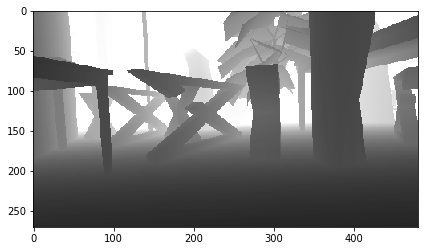

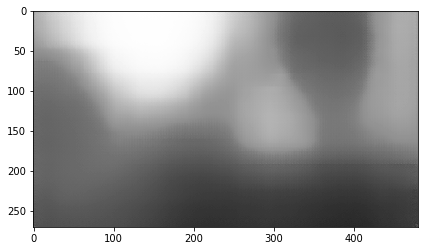

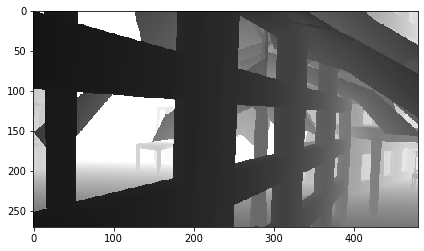

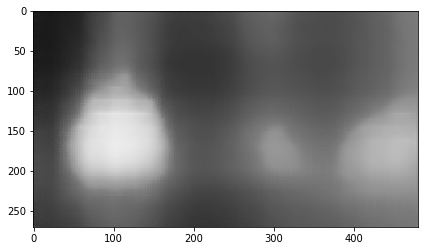

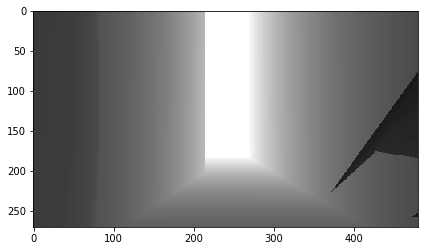

...

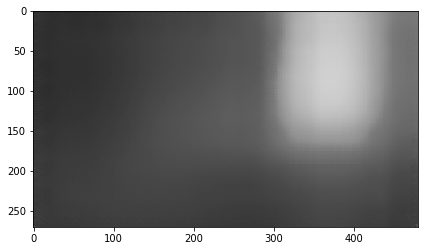

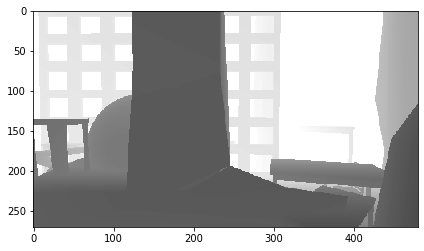

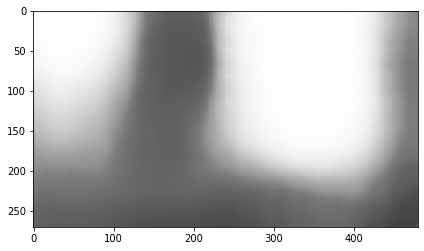

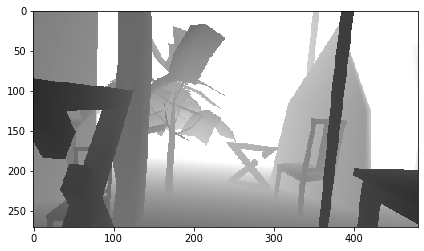

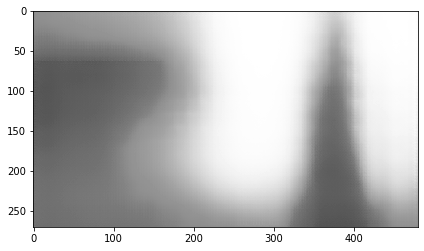

In [543]:
vae_model.eval()

# Visualise sample of images
with torch.no_grad():
    
    images, *_ = next(iter(test_loader))

    x_hat, *_ = vae_model(images)

    print(images.mean(), x_hat.mean())
    print(images.var(), x_hat.var())
    print(images.shape)
    for idx in range(len(images)):
        # show images
        imshow(images[idx])
        imshow(x_hat[idx])

Loading tfrecords...
Done.
- Before encoding, mean: 0.478 var: 0.132
- After encoding, mean: -4.797 var: 12.757
- Before deconv, mean: -0.010 var: 1.971
- After deconv 7, mean: 0.661 var: 7.613
- After sigmoid, mean: 0.512 var: 0.111
tensor(0.4782) tensor(0.5117)
tensor(0.1325) tensor(0.1105)
torch.Size([32, 1, 270, 480])


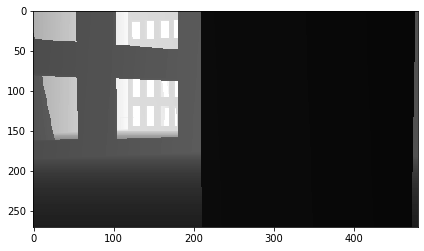

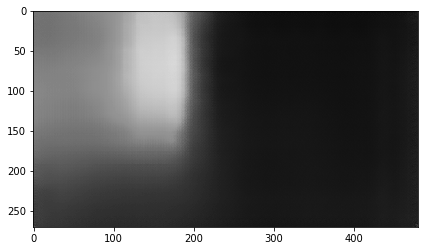

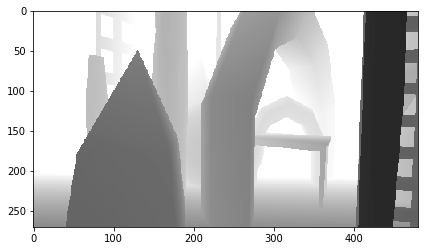

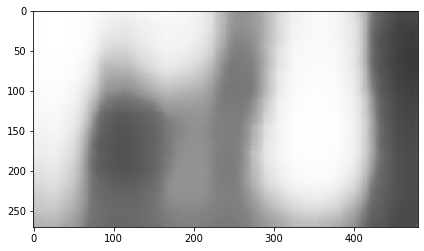

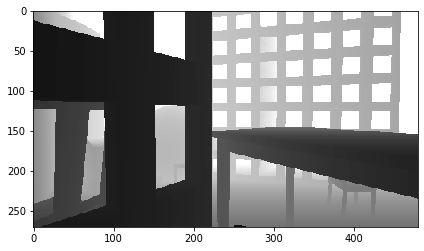

...

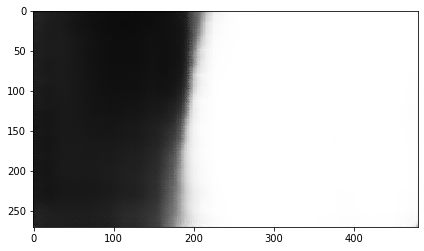

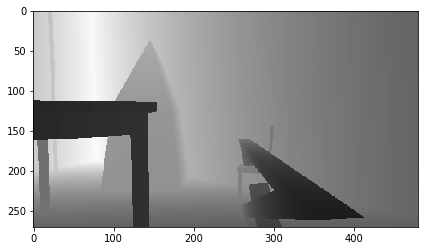

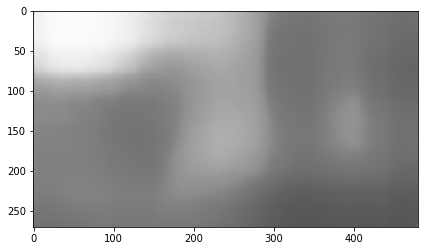

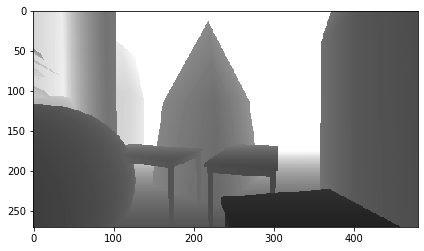

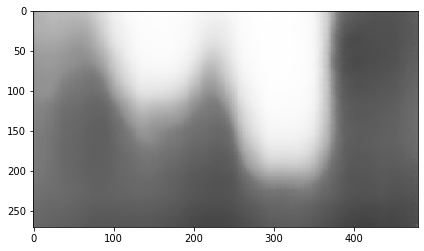

In [545]:
train_dataset = DepthImageDataset(tfrecord_folder=tfrecord_folder, batch_size=batch_size)
train_loader = DataLoader(dataset=train_dataset, batch_size=1, collate_fn=collate_batch)

vae_model.eval()
# Visualise sample of images

with torch.no_grad():
        
    images, *_ = next(iter(train_loader)) # since dataset is shuffled, essentially test 
    # VAE forward pass
    x_hat, *_ = vae_model(images)

    print(images.mean(), x_hat.mean())
    print(images.var(), x_hat.var())
    print(images.shape)
    for idx in range(len(images)):
        # show images
        imshow(images[idx])
        imshow(x_hat[idx])
